In [2]:
%matplotlib inline
import numpy as np 
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from scipy import stats
from scipy.signal import find_peaks
import os
import glob


from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score, confusion_matrix
from sklearn.metrics import classification_report
from sklearn import metrics
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split 
from featurewiz import featurewiz

Imported version = 0.1.87.
from featurewiz import FeatureWiz
wiz = FeatureWiz(verbose=1)
X_train_selected = wiz.fit_transform(X_train, y_train)
X_test_selected = wiz.transform(X_test)
wiz.features  ### provides a list of selected features ###
                                


In [3]:
from warnings import simplefilter
simplefilter(action="ignore", category=pd.errors.PerformanceWarning)

In [4]:
PATH = os.getcwd()
PATH = os.path.join(PATH, 'labelled(RL2)')
PATH

'D:\\LifeSpark Technology\\labelled(RL2)'

In [9]:
EXT = "*.csv"
files = [file
                 for path, subdir, files in os.walk(PATH)
                 for file in glob.glob(os.path.join(path, EXT))]
len(files)

2

In [10]:
subfolders = [ f.path for f in os.scandir(PATH) if f.is_dir() ]

In [11]:
subfolders

[]

In [12]:
def csab(dfr, time_steps, step):

    N_FEATURES = 6
    segments = []
    labels = []
    for i in range(0, len(dfr) - time_steps, step):
        label = stats.mode(dfr['freezing'][i: i + time_steps])[0][0]
        segments.append(dfr.iloc[i:i + time_steps, :-1])
        labels.append(label)

    reshaped_segments = np.asarray(segments, dtype= np.float32)#.reshape(-1, time_steps, N_FEATURES)
    labels = np.asarray(labels)

    return reshaped_segments, labels

In [13]:
def cfeatures(X):
    
    ax_list = []
    ay_list = []
    az_list = []
    gx_list = []
    gy_list = []
    gz_list = []

    for i in range (len(X)):
        ax_list.append(X[:,:,0][i])
        ay_list.append(X[:,:,1][i])
        az_list.append(X[:,:,2][i])
        gx_list.append(X[:,:,3][i])
        gy_list.append(X[:,:,4][i])
        gz_list.append(X[:,:,5][i])
    # Statistical Features on ax,ay,az,gx,gy,gz on time domain
    X_new = pd.DataFrame()

    # mean
    X_new['ax_mean'] = pd.Series(ax_list).apply(lambda x: x.mean())
    X_new['ay_mean'] = pd.Series(ay_list).apply(lambda x: x.mean())
    X_new['az_mean'] = pd.Series(az_list).apply(lambda x: x.mean())
    X_new['gx_mean'] = pd.Series(gx_list).apply(lambda x: x.mean())
    X_new['gy_mean'] = pd.Series(gy_list).apply(lambda x: x.mean())
    X_new['gz_mean'] = pd.Series(gz_list).apply(lambda x: x.mean())

    # std dev
    X_new['ax_std'] = pd.Series(ax_list).apply(lambda x: x.std())
    X_new['ay_std'] = pd.Series(ay_list).apply(lambda x: x.std())
    X_new['az_std'] = pd.Series(az_list).apply(lambda x: x.std())
    X_new['gx_std'] = pd.Series(gx_list).apply(lambda x: x.std())
    X_new['gy_std'] = pd.Series(gy_list).apply(lambda x: x.std())
    X_new['gz_std'] = pd.Series(gz_list).apply(lambda x: x.std())

    # avg absolute diff
    X_new['ax_aad'] = pd.Series(ax_list).apply(lambda x: np.mean(np.absolute(x - np.mean(x))))
    X_new['ay_aad'] = pd.Series(ay_list).apply(lambda x: np.mean(np.absolute(x - np.mean(x))))
    X_new['az_aad'] = pd.Series(az_list).apply(lambda x: np.mean(np.absolute(x - np.mean(x))))
    X_new['gx_aad'] = pd.Series(gx_list).apply(lambda x: np.mean(np.absolute(x - np.mean(x))))
    X_new['gy_aad'] = pd.Series(gy_list).apply(lambda x: np.mean(np.absolute(x - np.mean(x))))
    X_new['gz_aad'] = pd.Series(gz_list).apply(lambda x: np.mean(np.absolute(x - np.mean(x))))

    # min
    X_new['ax_min'] = pd.Series(ax_list).apply(lambda x: x.min())
    X_new['ay_min'] = pd.Series(ay_list).apply(lambda x: x.min())
    X_new['az_min'] = pd.Series(az_list).apply(lambda x: x.min())
    X_new['gx_min'] = pd.Series(gx_list).apply(lambda x: x.min())
    X_new['gy_min'] = pd.Series(gy_list).apply(lambda x: x.min())
    X_new['gz_min'] = pd.Series(gz_list).apply(lambda x: x.min())

    # max
    X_new['ax_max'] = pd.Series(ax_list).apply(lambda x: x.max())
    X_new['ay_max'] = pd.Series(ay_list).apply(lambda x: x.max())
    X_new['az_max'] = pd.Series(az_list).apply(lambda x: x.max())
    X_new['gx_max'] = pd.Series(gx_list).apply(lambda x: x.max())
    X_new['gy_max'] = pd.Series(gy_list).apply(lambda x: x.max())
    X_new['gz_max'] = pd.Series(gz_list).apply(lambda x: x.max())

    # max-min diff
    X_new['ax_maxmin_diff'] = X_new['ax_max'] - X_new['ax_min']
    X_new['ay_maxmin_diff'] = X_new['ay_max'] - X_new['ay_min']
    X_new['az_maxmin_diff'] = X_new['az_max'] - X_new['az_min']
    X_new['gx_maxmin_diff'] = X_new['gx_max'] - X_new['gx_min']
    X_new['gy_maxmin_diff'] = X_new['gy_max'] - X_new['gy_min']
    X_new['gz_maxmin_diff'] = X_new['gz_max'] - X_new['gz_min']

    # median
    X_new['ax_median'] = pd.Series(ax_list).apply(lambda x: np.median(x))
    X_new['ay_median'] = pd.Series(ay_list).apply(lambda x: np.median(x))
    X_new['az_median'] = pd.Series(az_list).apply(lambda x: np.median(x))
    X_new['gx_median'] = pd.Series(gx_list).apply(lambda x: np.median(x))
    X_new['gy_median'] = pd.Series(gy_list).apply(lambda x: np.median(x))
    X_new['gz_median'] = pd.Series(gz_list).apply(lambda x: np.median(x))

    # median abs dev 
    X_new['ax_mad'] = pd.Series(ax_list).apply(lambda x: np.median(np.absolute(x - np.median(x))))
    X_new['ay_mad'] = pd.Series(ay_list).apply(lambda x: np.median(np.absolute(x - np.median(x))))
    X_new['az_mad'] = pd.Series(az_list).apply(lambda x: np.median(np.absolute(x - np.median(x))))
    X_new['gx_mad'] = pd.Series(gx_list).apply(lambda x: np.median(np.absolute(x - np.median(x))))
    X_new['gy_mad'] = pd.Series(gy_list).apply(lambda x: np.median(np.absolute(x - np.median(x))))
    X_new['gz_mad'] = pd.Series(gz_list).apply(lambda x: np.median(np.absolute(x - np.median(x))))

    # interquartile range
    X_new['ax_IQR'] = pd.Series(ax_list).apply(lambda x: np.percentile(x, 75) - np.percentile(x, 25))
    X_new['ay_IQR'] = pd.Series(ay_list).apply(lambda x: np.percentile(x, 75) - np.percentile(x, 25))
    X_new['az_IQR'] = pd.Series(az_list).apply(lambda x: np.percentile(x, 75) - np.percentile(x, 25))
    X_new['gx_IQR'] = pd.Series(gx_list).apply(lambda x: np.percentile(x, 75) - np.percentile(x, 25))
    X_new['gy_IQR'] = pd.Series(gy_list).apply(lambda x: np.percentile(x, 75) - np.percentile(x, 25))
    X_new['gz_IQR'] = pd.Series(gz_list).apply(lambda x: np.percentile(x, 75) - np.percentile(x, 25))

    # negtive count
    X_new['ax_neg_count'] = pd.Series(ax_list).apply(lambda x: np.sum(x < 0))
    X_new['ay_neg_count'] = pd.Series(ay_list).apply(lambda x: np.sum(x < 0))
    X_new['az_neg_count'] = pd.Series(az_list).apply(lambda x: np.sum(x < 0))
    X_new['gx_neg_count'] = pd.Series(gx_list).apply(lambda x: np.sum(x < 0))
    X_new['gy_neg_count'] = pd.Series(gy_list).apply(lambda x: np.sum(x < 0))
    X_new['gz_neg_count'] = pd.Series(gz_list).apply(lambda x: np.sum(x < 0))

    # positive count
    X_new['ax_pos_count'] = pd.Series(ax_list).apply(lambda x: np.sum(x > 0))
    X_new['ay_pos_count'] = pd.Series(ay_list).apply(lambda x: np.sum(x > 0))
    X_new['az_pos_count'] = pd.Series(az_list).apply(lambda x: np.sum(x > 0))
    X_new['gx_pos_count'] = pd.Series(gx_list).apply(lambda x: np.sum(x > 0))
    X_new['gy_pos_count'] = pd.Series(gy_list).apply(lambda x: np.sum(x > 0))
    X_new['gz_pos_count'] = pd.Series(gz_list).apply(lambda x: np.sum(x > 0))


    # values above mean
    X_new['ax_above_mean'] = pd.Series(ax_list).apply(lambda x: np.sum(x > x.mean()))
    X_new['ay_above_mean'] = pd.Series(ay_list).apply(lambda x: np.sum(x > x.mean()))
    X_new['az_above_mean'] = pd.Series(az_list).apply(lambda x: np.sum(x > x.mean()))
    X_new['gx_above_mean'] = pd.Series(gx_list).apply(lambda x: np.sum(x > x.mean()))
    X_new['gy_above_mean'] = pd.Series(gy_list).apply(lambda x: np.sum(x > x.mean()))
    X_new['gz_above_mean'] = pd.Series(gz_list).apply(lambda x: np.sum(x > x.mean()))


    # number of peaks
    X_new['ax_peak_count'] = pd.Series(ax_list).apply(lambda x: len(find_peaks(x)[0]))
    X_new['ay_peak_count'] = pd.Series(ay_list).apply(lambda x: len(find_peaks(x)[0]))
    X_new['az_peak_count'] = pd.Series(az_list).apply(lambda x: len(find_peaks(x)[0]))
    X_new['gx_peak_count'] = pd.Series(gx_list).apply(lambda x: len(find_peaks(x)[0]))
    X_new['gy_peak_count'] = pd.Series(gy_list).apply(lambda x: len(find_peaks(x)[0]))
    X_new['gz_peak_count'] = pd.Series(gz_list).apply(lambda x: len(find_peaks(x)[0]))


    # skewness
    X_new['ax_skewness'] = pd.Series(ax_list).apply(lambda x: stats.skew(x))
    X_new['ay_skewness'] = pd.Series(ay_list).apply(lambda x: stats.skew(x))
    X_new['az_skewness'] = pd.Series(az_list).apply(lambda x: stats.skew(x))
    X_new['gx_skewness'] = pd.Series(gx_list).apply(lambda x: stats.skew(x))
    X_new['gy_skewness'] = pd.Series(gy_list).apply(lambda x: stats.skew(x))
    X_new['gz_skewness'] = pd.Series(gz_list).apply(lambda x: stats.skew(x))

    # kurtosis
    X_new['ax_kurtosis'] = pd.Series(ax_list).apply(lambda x: stats.kurtosis(x))
    X_new['ay_kurtosis'] = pd.Series(ay_list).apply(lambda x: stats.kurtosis(x))
    X_new['az_kurtosis'] = pd.Series(az_list).apply(lambda x: stats.kurtosis(x))
    X_new['gx_kurtosis'] = pd.Series(gx_list).apply(lambda x: stats.kurtosis(x))
    X_new['gy_kurtosis'] = pd.Series(gy_list).apply(lambda x: stats.kurtosis(x))
    X_new['gz_kurtosis'] = pd.Series(gz_list).apply(lambda x: stats.kurtosis(x))


    # energy
    X_new['ax_energy'] = pd.Series(ax_list).apply(lambda x: np.sum(x**2)/15)
    X_new['ay_energy'] = pd.Series(ay_list).apply(lambda x: np.sum(x**2)/15)
    X_new['az_energy'] = pd.Series(az_list).apply(lambda x: np.sum(x**2)/15)
    X_new['gx_energy'] = pd.Series(gx_list).apply(lambda x: np.sum(x**2)/15)
    X_new['gy_energy'] = pd.Series(gy_list).apply(lambda x: np.sum(x**2)/15)
    X_new['gz_energy'] = pd.Series(gz_list).apply(lambda x: np.sum(x**2)/15)
    # avg resultant
    X_new['avg_result_accl'] = [i.mean() for i in ((pd.Series(ax_list)**2 + pd.Series(ay_list)**2 + pd.Series(az_list)**2)**0.5)]
    
    X_new['avg_result_gyr'] = [i.mean() for i in ((pd.Series(gx_list)**2 + pd.Series(gy_list)**2 + pd.Series(gz_list)**2)**0.5)]

    # signal magnitude area
    X_new['sma_accl'] =    pd.Series(ax_list).apply(lambda x: np.sum(abs(x)/15)) + pd.Series(ay_list).apply(lambda x: np.sum(abs(x)/15)) \
                      + pd.Series(az_list).apply(lambda x: np.sum(abs(x)/15))
    X_new['sma_gyr'] =    pd.Series(gx_list).apply(lambda x: np.sum(abs(x)/15)) + pd.Series(gy_list).apply(lambda x: np.sum(abs(x)/15)) \
                      + pd.Series(gz_list).apply(lambda x: np.sum(abs(x)/15))
    
    # converting the signals from time domain to frequency domain using FFT
    ax_list_fft = pd.Series(ax_list).apply(lambda x: np.abs(np.fft.fft(x)))
    ay_list_fft = pd.Series(ay_list).apply(lambda x: np.abs(np.fft.fft(x)))
    az_list_fft = pd.Series(az_list).apply(lambda x: np.abs(np.fft.fft(x)))
    gx_list_fft = pd.Series(gx_list).apply(lambda x: np.abs(np.fft.fft(x)))
    gy_list_fft = pd.Series(gy_list).apply(lambda x: np.abs(np.fft.fft(x)))
    gz_list_fft = pd.Series(gz_list).apply(lambda x: np.abs(np.fft.fft(x)))

    # Statistical Features on raw x, y and z in frequency domain
    # FFT mean
    X_new['ax_mean_fft'] = pd.Series(ax_list_fft).apply(lambda x: x.mean())
    X_new['ay_mean_fft'] = pd.Series(ay_list_fft).apply(lambda x: x.mean())
    X_new['az_mean_fft'] = pd.Series(az_list_fft).apply(lambda x: x.mean())
    X_new['gx_mean_fft'] = pd.Series(gx_list_fft).apply(lambda x: x.mean())
    X_new['gy_mean_fft'] = pd.Series(gy_list_fft).apply(lambda x: x.mean())
    X_new['gz_mean_fft'] = pd.Series(gz_list_fft).apply(lambda x: x.mean())

    # FFT std dev
    X_new['ax_std_fft'] = pd.Series(ax_list_fft).apply(lambda x: x.std())
    X_new['ay_std_fft'] = pd.Series(ay_list_fft).apply(lambda x: x.std())
    X_new['az_std_fft'] = pd.Series(az_list_fft).apply(lambda x: x.std())
    X_new['gx_std_fft'] = pd.Series(gx_list_fft).apply(lambda x: x.std())
    X_new['gy_std_fft'] = pd.Series(gy_list_fft).apply(lambda x: x.std())
    X_new['gz_std_fft'] = pd.Series(gz_list_fft).apply(lambda x: x.std())

    # FFT avg absolute diff
    X_new['ax_aad_fft'] = pd.Series(ax_list_fft).apply(lambda x: np.mean(np.absolute(x - np.mean(x))))
    X_new['ay_aad_fft'] = pd.Series(ay_list_fft).apply(lambda x: np.mean(np.absolute(x - np.mean(x))))
    X_new['az_aad_fft'] = pd.Series(az_list_fft).apply(lambda x: np.mean(np.absolute(x - np.mean(x))))
    X_new['gx_aad_fft'] = pd.Series(gx_list_fft).apply(lambda x: np.mean(np.absolute(x - np.mean(x))))
    X_new['gy_aad_fft'] = pd.Series(gy_list_fft).apply(lambda x: np.mean(np.absolute(x - np.mean(x))))
    X_new['gz_aad_fft'] = pd.Series(gz_list_fft).apply(lambda x: np.mean(np.absolute(x - np.mean(x))))

    # FFT min
    X_new['ax_min_fft'] = pd.Series(ax_list_fft).apply(lambda x: x.min())
    X_new['ay_min_fft'] = pd.Series(ay_list_fft).apply(lambda x: x.min())
    X_new['az_min_fft'] = pd.Series(az_list_fft).apply(lambda x: x.min())
    X_new['gx_min_fft'] = pd.Series(gx_list_fft).apply(lambda x: x.min())
    X_new['gy_min_fft'] = pd.Series(gy_list_fft).apply(lambda x: x.min())
    X_new['gz_min_fft'] = pd.Series(gz_list_fft).apply(lambda x: x.min())

    # FFT max
    X_new['ax_max_fft'] = pd.Series(ax_list_fft).apply(lambda x: x.max())
    X_new['ay_max_fft'] = pd.Series(ay_list_fft).apply(lambda x: x.max())
    X_new['az_max_fft'] = pd.Series(az_list_fft).apply(lambda x: x.max())
    X_new['gx_max_fft'] = pd.Series(gx_list_fft).apply(lambda x: x.max())
    X_new['gy_max_fft'] = pd.Series(gy_list_fft).apply(lambda x: x.max())
    X_new['gz_max_fft'] = pd.Series(gz_list_fft).apply(lambda x: x.max())

    # FFT max-min diff
    X_new['ax_maxmin_diff_fft'] = X_new['ax_max_fft'] - X_new['ax_min_fft']
    X_new['ay_maxmin_diff_fft'] = X_new['ay_max_fft'] - X_new['ay_min_fft']
    X_new['az_maxmin_diff_fft'] = X_new['az_max_fft'] - X_new['az_min_fft']
    X_new['gx_maxmin_diff_fft'] = X_new['gx_max_fft'] - X_new['gx_min_fft']
    X_new['gy_maxmin_diff_fft'] = X_new['gy_max_fft'] - X_new['gy_min_fft']
    X_new['gz_maxmin_diff_fft'] = X_new['gz_max_fft'] - X_new['gz_min_fft']

    # FFT median
    X_new['ax_median_fft'] = pd.Series(ax_list_fft).apply(lambda x: np.median(x))
    X_new['ay_median_fft'] = pd.Series(ay_list_fft).apply(lambda x: np.median(x))
    X_new['az_median_fft'] = pd.Series(az_list_fft).apply(lambda x: np.median(x))
    X_new['gx_median_fft'] = pd.Series(gx_list_fft).apply(lambda x: np.median(x))
    X_new['gy_median_fft'] = pd.Series(gy_list_fft).apply(lambda x: np.median(x))
    X_new['gz_median_fft'] = pd.Series(gz_list_fft).apply(lambda x: np.median(x))

    # FFT median abs dev 
    X_new['ax_mad_fft'] = pd.Series(ax_list_fft).apply(lambda x: np.median(np.absolute(x - np.median(x))))
    X_new['ay_mad_fft'] = pd.Series(ay_list_fft).apply(lambda x: np.median(np.absolute(x - np.median(x))))
    X_new['az_mad_fft'] = pd.Series(az_list_fft).apply(lambda x: np.median(np.absolute(x - np.median(x))))
    X_new['gx_mad_fft'] = pd.Series(gx_list_fft).apply(lambda x: np.median(np.absolute(x - np.median(x))))
    X_new['gy_mad_fft'] = pd.Series(gy_list_fft).apply(lambda x: np.median(np.absolute(x - np.median(x))))
    X_new['gz_mad_fft'] = pd.Series(gz_list_fft).apply(lambda x: np.median(np.absolute(x - np.median(x))))

    # FFT Interquartile range
    X_new['ax_IQR_fft'] = pd.Series(ax_list_fft).apply(lambda x: np.percentile(x, 75) - np.percentile(x, 25))
    X_new['ay_IQR_fft'] = pd.Series(ay_list_fft).apply(lambda x: np.percentile(x, 75) - np.percentile(x, 25))
    X_new['az_IQR_fft'] = pd.Series(az_list_fft).apply(lambda x: np.percentile(x, 75) - np.percentile(x, 25))
    X_new['gx_IQR_fft'] = pd.Series(gx_list_fft).apply(lambda x: np.percentile(x, 75) - np.percentile(x, 25))
    X_new['gy_IQR_fft'] = pd.Series(gy_list_fft).apply(lambda x: np.percentile(x, 75) - np.percentile(x, 25))
    X_new['gz_IQR_fft'] = pd.Series(gz_list_fft).apply(lambda x: np.percentile(x, 75) - np.percentile(x, 25))

    # FFT values above mean
    X_new['ax_above_mean_fft'] = pd.Series(ax_list_fft).apply(lambda x: np.sum(x > x.mean()))
    X_new['ay_above_mean_fft'] = pd.Series(ay_list_fft).apply(lambda x: np.sum(x > x.mean()))
    X_new['az_above_mean_fft'] = pd.Series(az_list_fft).apply(lambda x: np.sum(x > x.mean()))
    X_new['gx_above_mean_fft'] = pd.Series(gx_list_fft).apply(lambda x: np.sum(x > x.mean()))
    X_new['gy_above_mean_fft'] = pd.Series(gy_list_fft).apply(lambda x: np.sum(x > x.mean()))
    X_new['gz_above_mean_fft'] = pd.Series(gz_list_fft).apply(lambda x: np.sum(x > x.mean()))

    # FFT number of peaks
    X_new['ax_peak_count_fft'] = pd.Series(ax_list_fft).apply(lambda x: len(find_peaks(x)[0]))
    X_new['ay_peak_count_fft'] = pd.Series(ay_list_fft).apply(lambda x: len(find_peaks(x)[0]))
    X_new['az_peak_count_fft'] = pd.Series(az_list_fft).apply(lambda x: len(find_peaks(x)[0]))
    X_new['gx_peak_count_fft'] = pd.Series(gx_list_fft).apply(lambda x: len(find_peaks(x)[0]))
    X_new['gy_peak_count_fft'] = pd.Series(gy_list_fft).apply(lambda x: len(find_peaks(x)[0]))
    X_new['gz_peak_count_fft'] = pd.Series(gz_list_fft).apply(lambda x: len(find_peaks(x)[0]))

    # FFT skewness
    X_new['ax_skewness_fft'] = pd.Series(ax_list_fft).apply(lambda x: stats.skew(x))
    X_new['ay_skewness_fft'] = pd.Series(ay_list_fft).apply(lambda x: stats.skew(x))
    X_new['az_skewness_fft'] = pd.Series(az_list_fft).apply(lambda x: stats.skew(x))
    X_new['gx_skewness_fft'] = pd.Series(gx_list_fft).apply(lambda x: stats.skew(x))
    X_new['gy_skewness_fft'] = pd.Series(gy_list_fft).apply(lambda x: stats.skew(x))
    X_new['gz_skewness_fft'] = pd.Series(gz_list_fft).apply(lambda x: stats.skew(x))

    # FFT kurtosis
    X_new['ax_kurtosis_fft'] = pd.Series(ax_list_fft).apply(lambda x: stats.kurtosis(x))
    X_new['ay_kurtosis_fft'] = pd.Series(ay_list_fft).apply(lambda x: stats.kurtosis(x))
    X_new['az_kurtosis_fft'] = pd.Series(az_list_fft).apply(lambda x: stats.kurtosis(x))
    X_new['gx_kurtosis_fft'] = pd.Series(gx_list_fft).apply(lambda x: stats.kurtosis(x))
    X_new['gy_kurtosis_fft'] = pd.Series(gy_list_fft).apply(lambda x: stats.kurtosis(x))
    X_new['gz_kurtosis_fft'] = pd.Series(gz_list_fft).apply(lambda x: stats.kurtosis(x))

    # FFT energy
    X_new['ax_energy_fft'] = pd.Series(ax_list_fft).apply(lambda x: np.sum(x**2)/15)
    X_new['ay_energy_fft'] = pd.Series(ay_list_fft).apply(lambda x: np.sum(x**2)/15)
    X_new['az_energy_fft'] = pd.Series(az_list_fft).apply(lambda x: np.sum(x**2/15))
    X_new['gx_energy_fft'] = pd.Series(gx_list_fft).apply(lambda x: np.sum(x**2)/15)
    X_new['gy_energy_fft'] = pd.Series(gy_list_fft).apply(lambda x: np.sum(x**2)/15)
    X_new['gz_energy_fft'] = pd.Series(gz_list_fft).apply(lambda x: np.sum(x**2/15))

    # FFT avg resultant
    X_new['avg_result_accl_fft'] = [i.mean() for i in ((pd.Series(ax_list_fft)**2 + pd.Series(ay_list_fft)**2 + pd.Series(az_list_fft)**2)**0.5)]
    
    X_new['avg_result_gyr_fft'] = [i.mean() for i in ((pd.Series(gx_list_fft)**2 + pd.Series(gy_list_fft)**2 + pd.Series(gz_list_fft)**2)**0.5)]

    # FFT Signal magnitude area
    X_new['sma_accl_fft'] = pd.Series(ax_list_fft).apply(lambda x: np.sum(abs(x)/15)) + pd.Series(ay_list_fft).apply(lambda x: np.sum(abs(x)/15)) \
                         + pd.Series(az_list_fft).apply(lambda x: np.sum(abs(x)/15))
    
    X_new['sma_gyr_fft'] = pd.Series(gx_list_fft).apply(lambda x: np.sum(abs(x)/15)) + pd.Series(gy_list_fft).apply(lambda x: np.sum(abs(x)/15)) \
                         + pd.Series(gz_list_fft).apply(lambda x: np.sum(abs(x)/15))
    
    # Max Indices and Min indices 

    # index of max value in time domain
    X_new['ax_argmax'] = pd.Series(ax_list).apply(lambda x: np.argmax(x))
    X_new['ay_argmax'] = pd.Series(ay_list).apply(lambda x: np.argmax(x))
    X_new['az_argmax'] = pd.Series(az_list).apply(lambda x: np.argmax(x))
    X_new['gx_argmax'] = pd.Series(gx_list).apply(lambda x: np.argmax(x))
    X_new['gy_argmax'] = pd.Series(gy_list).apply(lambda x: np.argmax(x))
    X_new['gz_argmax'] = pd.Series(gz_list).apply(lambda x: np.argmax(x))

    # index of min value in time domain
    X_new['ax_argmin'] = pd.Series(ax_list).apply(lambda x: np.argmin(x))
    X_new['ay_argmin'] = pd.Series(ay_list).apply(lambda x: np.argmin(x))
    X_new['az_argmin'] = pd.Series(az_list).apply(lambda x: np.argmin(x))
    X_new['gx_argmin'] = pd.Series(gx_list).apply(lambda x: np.argmin(x))
    X_new['gy_argmin'] = pd.Series(gy_list).apply(lambda x: np.argmin(x))
    X_new['gz_argmin'] = pd.Series(gz_list).apply(lambda x: np.argmin(x))

    # absolute difference between above indices
    X_new['ax_arg_diff'] = abs(X_new['ax_argmax'] - X_new['ax_argmin'])
    X_new['ay_arg_diff'] = abs(X_new['ay_argmax'] - X_new['ay_argmin'])
    X_new['az_arg_diff'] = abs(X_new['az_argmax'] - X_new['az_argmin'])
    X_new['gx_arg_diff'] = abs(X_new['gx_argmax'] - X_new['gx_argmin'])
    X_new['gy_arg_diff'] = abs(X_new['gy_argmax'] - X_new['gy_argmin'])
    X_new['gz_arg_diff'] = abs(X_new['gz_argmax'] - X_new['gz_argmin'])

    # index of max value in frequency domain
    X_new['ax_argmax_fft'] = pd.Series(ax_list_fft).apply(lambda x: np.argmax(np.abs(np.fft.fft(x))))
    X_new['ay_argmax_fft'] = pd.Series(ay_list_fft).apply(lambda x: np.argmax(np.abs(np.fft.fft(x))))
    X_new['az_argmax_fft'] = pd.Series(az_list_fft).apply(lambda x: np.argmax(np.abs(np.fft.fft(x))))
    X_new['gx_argmax_fft'] = pd.Series(gx_list_fft).apply(lambda x: np.argmax(np.abs(np.fft.fft(x))))
    X_new['gy_argmax_fft'] = pd.Series(gy_list_fft).apply(lambda x: np.argmax(np.abs(np.fft.fft(x))))
    X_new['gz_argmax_fft'] = pd.Series(gz_list_fft).apply(lambda x: np.argmax(np.abs(np.fft.fft(x))))

    # index of min value in frequency domain
    X_new['ax_argmin_fft'] = pd.Series(ax_list_fft).apply(lambda x: np.argmin(np.abs(np.fft.fft(x))))
    X_new['ay_argmin_fft'] = pd.Series(ay_list_fft).apply(lambda x: np.argmin(np.abs(np.fft.fft(x))))
    X_new['az_argmin_fft'] = pd.Series(az_list_fft).apply(lambda x: np.argmin(np.abs(np.fft.fft(x))))
    X_new['gx_argmin_fft'] = pd.Series(gx_list_fft).apply(lambda x: np.argmin(np.abs(np.fft.fft(x))))
    X_new['gy_argmin_fft'] = pd.Series(gy_list_fft).apply(lambda x: np.argmin(np.abs(np.fft.fft(x))))
    X_new['gz_argmin_fft'] = pd.Series(gz_list_fft).apply(lambda x: np.argmin(np.abs(np.fft.fft(x))))

    # absolute difference between above indices
    X_new['ax_arg_diff_fft'] = abs(X_new['ax_argmax_fft'] - X_new['ax_argmin_fft'])
    X_new['ay_arg_diff_fft'] = abs(X_new['ay_argmax_fft'] - X_new['ay_argmin_fft'])
    X_new['az_arg_diff_fft'] = abs(X_new['az_argmax_fft'] - X_new['az_argmin_fft'])
    X_new['gx_arg_diff_fft'] = abs(X_new['gx_argmax_fft'] - X_new['gx_argmin_fft'])
    X_new['gy_arg_diff_fft'] = abs(X_new['gy_argmax_fft'] - X_new['gy_argmin_fft'])
    X_new['gz_arg_diff_fft'] = abs(X_new['gz_argmax_fft'] - X_new['gz_argmin_fft'])
    
    return X_new

In [14]:
def DA_Jitter(X, sigma=0.05):
    myNoise = np.random.normal(loc=0, scale=sigma, size=X.shape)
    return X+myNoise

def DA_Scaling(X, sigma=0.1):
    scalingFactor = np.random.normal(loc=1.0, scale=sigma, size=(1,X.shape[1])) # shape=(1,3)
    myNoise = np.matmul(np.ones((X.shape[0],1)), scalingFactor)
    return X*myNoise

def DA_TimeWarp(X, sigma):
    tt_new = DistortTimesteps(X, sigma)
    X_new = np.zeros(X.shape)
    x_range = np.arange(X.shape[0])
    X_new[:,0] = np.interp(x_range, tt_new[:,0], X[:,0])
    X_new[:,1] = np.interp(x_range, tt_new[:,1], X[:,1])
    X_new[:,2] = np.interp(x_range, tt_new[:,2], X[:,2])
    X_new[:,3] = np.interp(x_range, tt_new[:,3], X[:,3])
    X_new[:,4] = np.interp(x_range, tt_new[:,4], X[:,4])
    X_new[:,5] = np.interp(x_range, tt_new[:,5], X[:,5])
    return X_new

def DA_MagWarp(X, sigma):
    return X * GenerateRandomCurves(X, sigma)

def DA_Rotation(X):
    axis = np.random.uniform(low=-1, high=1, size=X.shape[1])
    angle = np.random.uniform(low=-np.pi, high=np.pi)
    return np.matmul(X , axangle2mat(axis,angle))

AK
left

 Random Forest - using top 10 features from global model
test set Accuracy: 0.819672131147541

 -------------Classification Report-------------

              precision    recall  f1-score   support

         0.0       0.86      0.93      0.89        99
         1.0       0.53      0.35      0.42        23

    accuracy                           0.82       122
   macro avg       0.70      0.64      0.66       122
weighted avg       0.80      0.82      0.80       122

test set:
[[92  7]
 [15  8]]


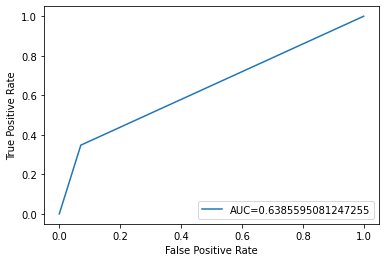

Validation set Accuracy: 0.8442622950819673

 -------------Classification Report-------------

              precision    recall  f1-score   support

         0.0       0.86      0.96      0.91        99
         1.0       0.67      0.35      0.46        23

    accuracy                           0.84       122
   macro avg       0.77      0.65      0.68       122
weighted avg       0.83      0.84      0.82       122

test set:
[[95  4]
 [15  8]]


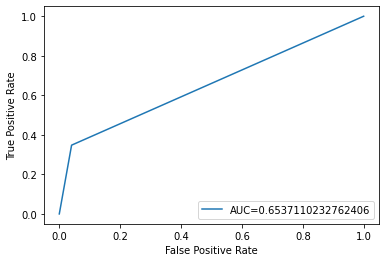

############################################################################################
############       F A S T   F E A T U R E  E N G G    A N D    S E L E C T I O N ! ########
# Be judicious with featurewiz. Don't use it to create too many un-interpretable features! #
############################################################################################
Skipping feature engineering since no feature_engg input...
Skipping category encoding since no category encoders specified in input...
**INFO: featurewiz can now read feather formatted files. Loading train data...
    Shape of your Data Set loaded: (366, 225)
    Loaded train data. Shape = (366, 225)
No test data filename given...
#######################################################################################
######################## C L A S S I F Y I N G  V A R I A B L E S  ####################
#######################################################################################
Classifying variables in data 

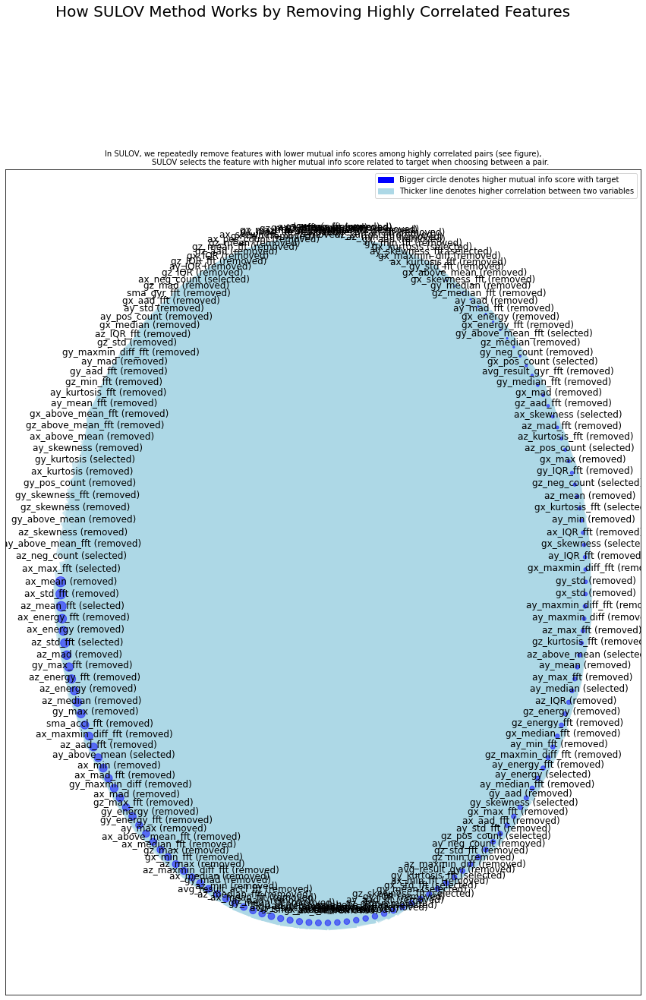

Time taken for SULOV method = 2 seconds
    Adding 0 categorical variables to reduced numeric variables  of 71
Final list of selected vars after SULOV = 71
Readying dataset for Recursive XGBoost by converting all features to numeric...
#######################################################################################
#####    R E C U R S I V E   X G B O O S T : F E A T U R E   S E L E C T I O N  #######
#######################################################################################
    using regular XGBoost
Train and Test loaded into Dask dataframes successfully after feature_engg completed
Current number of predictors = 71 
    XGBoost version: 1.6.1
Number of booster rounds = 100
        using 71 variables...
            Time taken for regular XGBoost feature selection = 0 seconds
        using 57 variables...
            Time taken for regular XGBoost feature selection = 0 seconds
        using 43 variables...
            Time taken for regular XGBoost feature selection

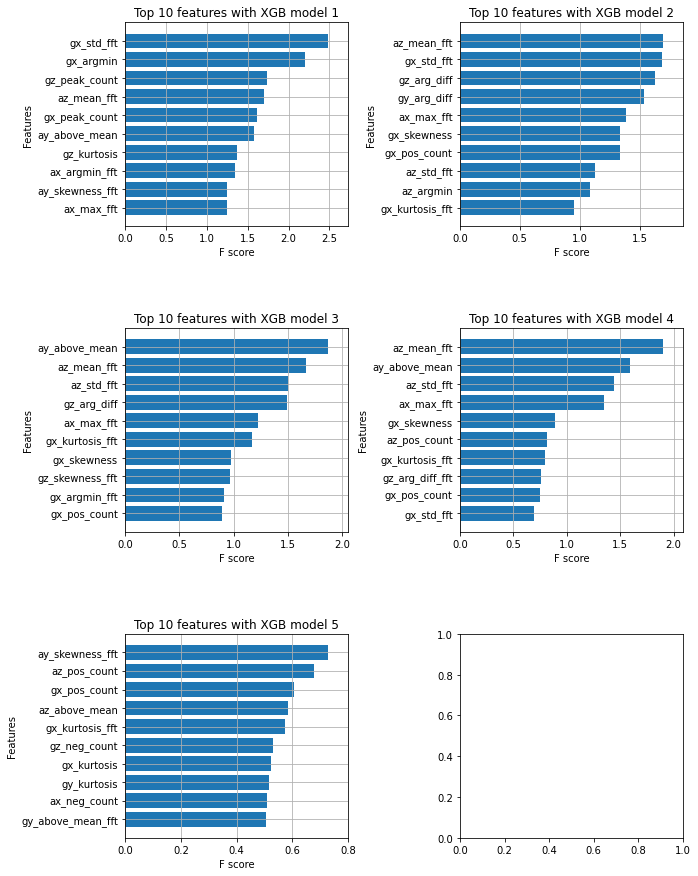

            Total time taken for XGBoost feature selection = 2 seconds
#######################################################################################
#####          F E A T U R E   S E L E C T I O N   C O M P L E T E D            #######
#######################################################################################
Selected 55 important features. Too many to print...

    Time taken for feature selection = 4 seconds
Returning 2 dataframes: dataname and test_data with 55 important features.
top 10 features: /n
['gx_std_fft', 'gx_argmin', 'gz_peak_count', 'az_mean_fft', 'gx_peak_count', 'ay_above_mean', 'gz_kurtosis', 'ax_argmin_fft', 'ay_skewness_fft', 'ax_max_fft']



 Random Forest - using top 10 features from individual model
test set Accuracy: 0.7786885245901639

 -------------Classification Report-------------

              precision    recall  f1-score   support

         0.0       0.82      0.94      0.87        99
         1.0       0.25      0.09      0.13   

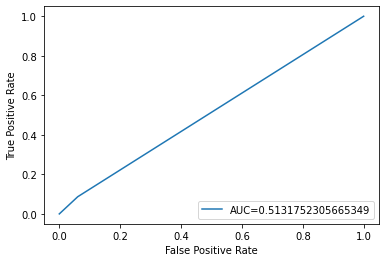

Validation set Accuracy: 0.8278688524590164

 -------------Classification Report-------------

              precision    recall  f1-score   support

         0.0       0.87      0.93      0.90        99
         1.0       0.56      0.39      0.46        23

    accuracy                           0.83       122
   macro avg       0.72      0.66      0.68       122
weighted avg       0.81      0.83      0.82       122

test set:
[[92  7]
 [14  9]]


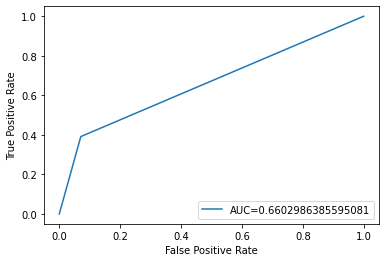

Right

 Random Forest - using top 10 features from global model
test set Accuracy: 0.8852459016393442

 -------------Classification Report-------------

              precision    recall  f1-score   support

         0.0       0.88      1.00      0.93        99
         1.0       1.00      0.39      0.56        23

    accuracy                           0.89       122
   macro avg       0.94      0.70      0.75       122
weighted avg       0.90      0.89      0.86       122

test set:
[[99  0]
 [14  9]]


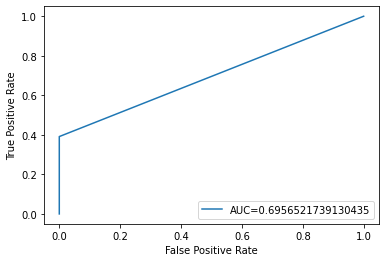

Validation set Accuracy: 0.8688524590163934

 -------------Classification Report-------------

              precision    recall  f1-score   support

         0.0       0.87      0.99      0.92        99
         1.0       0.89      0.35      0.50        23

    accuracy                           0.87       122
   macro avg       0.88      0.67      0.71       122
weighted avg       0.87      0.87      0.84       122

test set:
[[98  1]
 [15  8]]


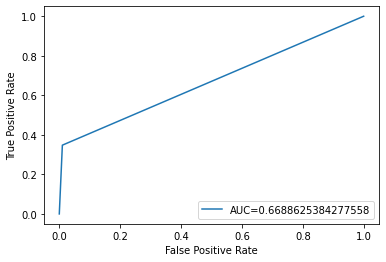

############################################################################################
############       F A S T   F E A T U R E  E N G G    A N D    S E L E C T I O N ! ########
# Be judicious with featurewiz. Don't use it to create too many un-interpretable features! #
############################################################################################
Skipping feature engineering since no feature_engg input...
Skipping category encoding since no category encoders specified in input...
**INFO: featurewiz can now read feather formatted files. Loading train data...
    Shape of your Data Set loaded: (366, 225)
    Loaded train data. Shape = (366, 225)
No test data filename given...
#######################################################################################
######################## C L A S S I F Y I N G  V A R I A B L E S  ####################
#######################################################################################
Classifying variables in data 

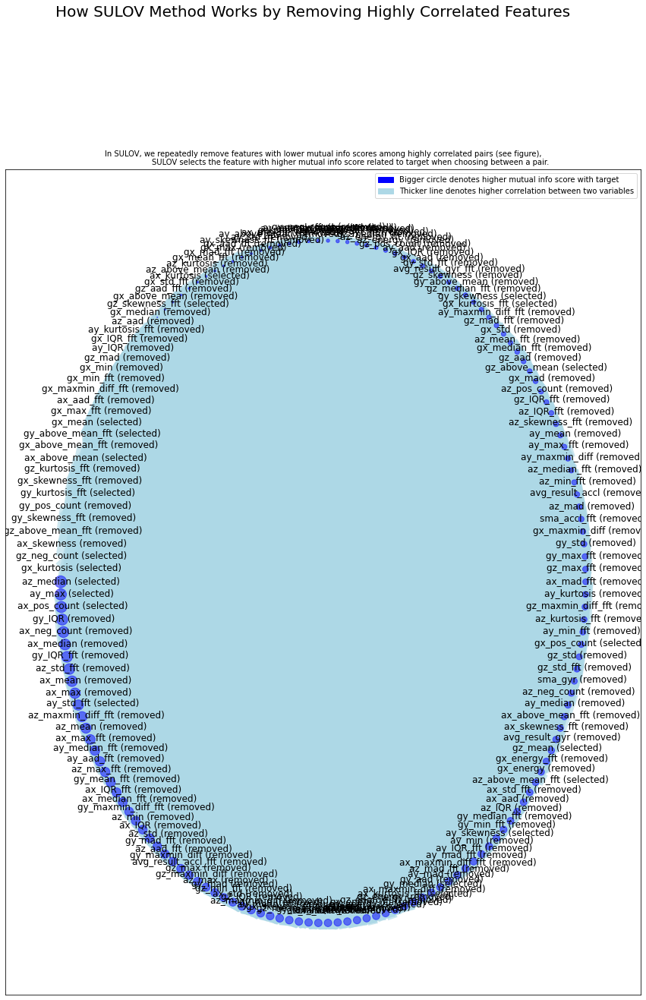

Time taken for SULOV method = 3 seconds
    Adding 0 categorical variables to reduced numeric variables  of 70
Final list of selected vars after SULOV = 70
Readying dataset for Recursive XGBoost by converting all features to numeric...
#######################################################################################
#####    R E C U R S I V E   X G B O O S T : F E A T U R E   S E L E C T I O N  #######
#######################################################################################
    using regular XGBoost
Train and Test loaded into Dask dataframes successfully after feature_engg completed
Current number of predictors = 70 
    XGBoost version: 1.6.1
Number of booster rounds = 100
        using 70 variables...
            Time taken for regular XGBoost feature selection = 0 seconds
        using 56 variables...
            Time taken for regular XGBoost feature selection = 0 seconds
        using 42 variables...
            Time taken for regular XGBoost feature selection

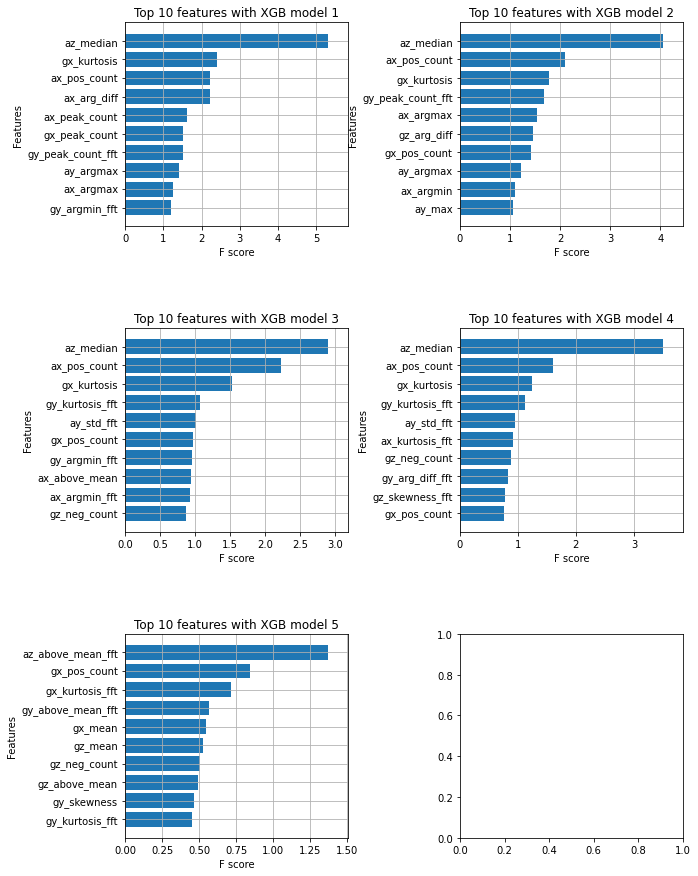

            Total time taken for XGBoost feature selection = 1 seconds
#######################################################################################
#####          F E A T U R E   S E L E C T I O N   C O M P L E T E D            #######
#######################################################################################
Selected 58 important features. Too many to print...

    Time taken for feature selection = 5 seconds
Returning 2 dataframes: dataname and test_data with 58 important features.
top 10 features: /n
['az_median', 'gx_kurtosis', 'ax_pos_count', 'ax_arg_diff', 'ax_peak_count', 'gx_peak_count', 'gy_peak_count_fft', 'ay_argmax', 'ax_argmax', 'gy_argmin_fft']



 Random Forest - using top 10 features from individual model
test set Accuracy: 0.8770491803278688

 -------------Classification Report-------------

              precision    recall  f1-score   support

         0.0       0.89      0.97      0.93        99
         1.0       0.79      0.48      0.59    

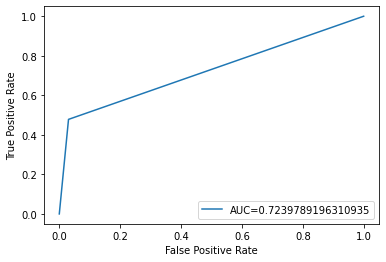

Validation set Accuracy: 0.8688524590163934

 -------------Classification Report-------------

              precision    recall  f1-score   support

         0.0       0.88      0.97      0.92        99
         1.0       0.77      0.43      0.56        23

    accuracy                           0.87       122
   macro avg       0.82      0.70      0.74       122
weighted avg       0.86      0.87      0.85       122

test set:
[[96  3]
 [13 10]]


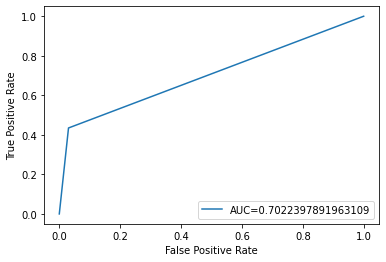

AKK
left

 Random Forest - using top 10 features from global model
test set Accuracy: 0.9775280898876404

 -------------Classification Report-------------

              precision    recall  f1-score   support

         0.0       0.98      0.99      0.98       130
         1.0       0.98      0.94      0.96        48

    accuracy                           0.98       178
   macro avg       0.98      0.96      0.97       178
weighted avg       0.98      0.98      0.98       178

test set:
[[129   1]
 [  3  45]]


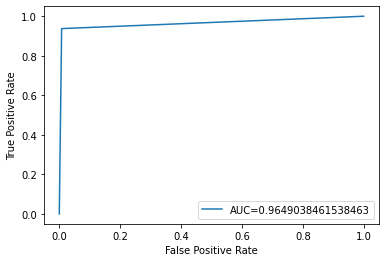

Validation set Accuracy: 0.9213483146067416

 -------------Classification Report-------------

              precision    recall  f1-score   support

         0.0       0.92      0.98      0.95       130
         1.0       0.93      0.77      0.84        48

    accuracy                           0.92       178
   macro avg       0.92      0.87      0.89       178
weighted avg       0.92      0.92      0.92       178

test set:
[[127   3]
 [ 11  37]]


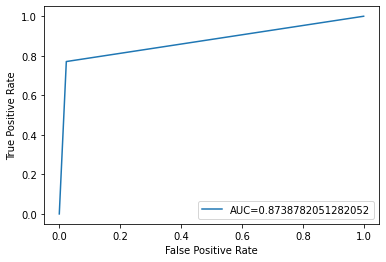

############################################################################################
############       F A S T   F E A T U R E  E N G G    A N D    S E L E C T I O N ! ########
# Be judicious with featurewiz. Don't use it to create too many un-interpretable features! #
############################################################################################
Skipping feature engineering since no feature_engg input...
Skipping category encoding since no category encoders specified in input...
**INFO: featurewiz can now read feather formatted files. Loading train data...
    Shape of your Data Set loaded: (532, 225)
    Loaded train data. Shape = (532, 225)
No test data filename given...
#######################################################################################
######################## C L A S S I F Y I N G  V A R I A B L E S  ####################
#######################################################################################
Classifying variables in data 

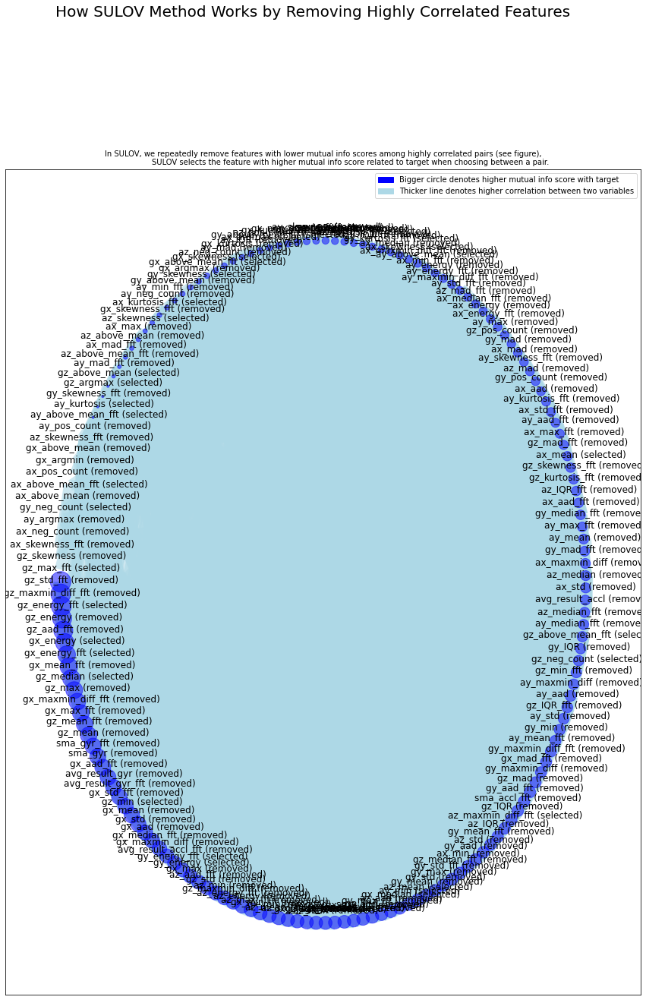

Time taken for SULOV method = 3 seconds
    Adding 0 categorical variables to reduced numeric variables  of 78
Final list of selected vars after SULOV = 78
Readying dataset for Recursive XGBoost by converting all features to numeric...
#######################################################################################
#####    R E C U R S I V E   X G B O O S T : F E A T U R E   S E L E C T I O N  #######
#######################################################################################
    using regular XGBoost
Train and Test loaded into Dask dataframes successfully after feature_engg completed
Current number of predictors = 78 
    XGBoost version: 1.6.1
Number of booster rounds = 100
        using 78 variables...
            Time taken for regular XGBoost feature selection = 0 seconds
        using 62 variables...
            Time taken for regular XGBoost feature selection = 0 seconds
        using 46 variables...
            Time taken for regular XGBoost feature selection

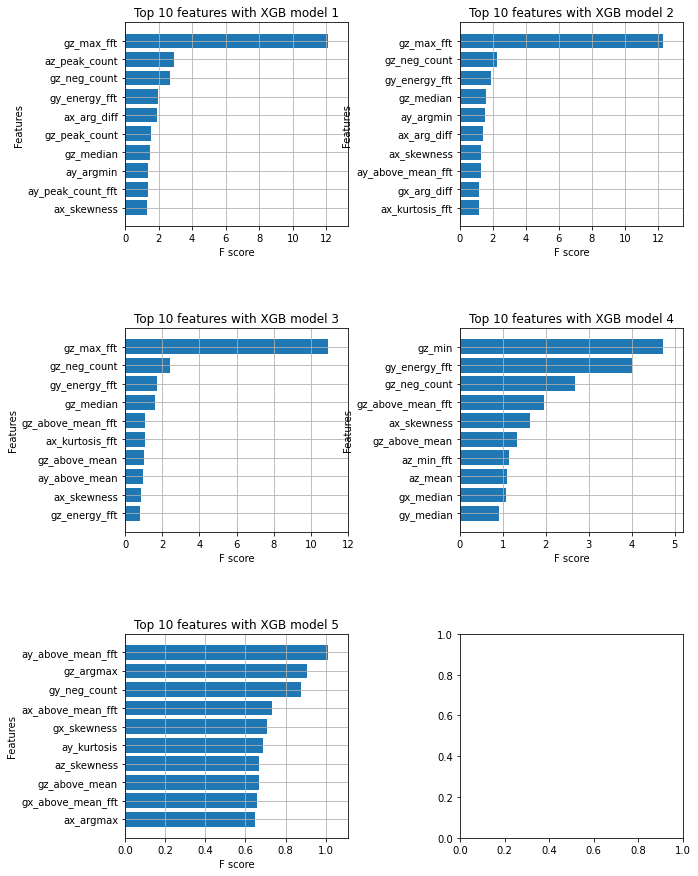

            Total time taken for XGBoost feature selection = 2 seconds
#######################################################################################
#####          F E A T U R E   S E L E C T I O N   C O M P L E T E D            #######
#######################################################################################
Selected 57 important features. Too many to print...

    Time taken for feature selection = 5 seconds
Returning 2 dataframes: dataname and test_data with 57 important features.
top 10 features: /n
['gz_max_fft', 'az_peak_count', 'gz_neg_count', 'gy_energy_fft', 'ax_arg_diff', 'gz_peak_count', 'gz_median', 'ay_argmin', 'ay_peak_count_fft', 'ax_skewness']



 Random Forest - using top 10 features from individual model
test set Accuracy: 0.9719101123595506

 -------------Classification Report-------------

              precision    recall  f1-score   support

         0.0       0.98      0.98      0.98       130
         1.0       0.94      0.96      0.95   

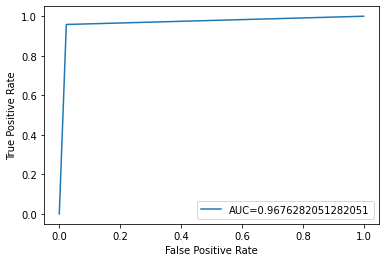

Validation set Accuracy: 0.9101123595505618

 -------------Classification Report-------------

              precision    recall  f1-score   support

         0.0       0.92      0.96      0.94       130
         1.0       0.88      0.77      0.82        48

    accuracy                           0.91       178
   macro avg       0.90      0.87      0.88       178
weighted avg       0.91      0.91      0.91       178

test set:
[[125   5]
 [ 11  37]]


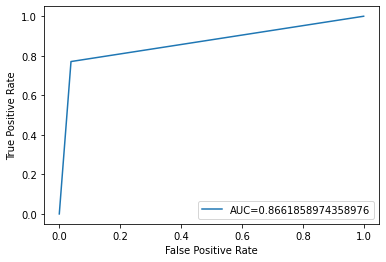

Right

 Random Forest - using top 10 features from global model
test set Accuracy: 0.9325842696629213

 -------------Classification Report-------------

              precision    recall  f1-score   support

         0.0       0.93      0.98      0.95       130
         1.0       0.93      0.81      0.87        48

    accuracy                           0.93       178
   macro avg       0.93      0.89      0.91       178
weighted avg       0.93      0.93      0.93       178

test set:
[[127   3]
 [  9  39]]


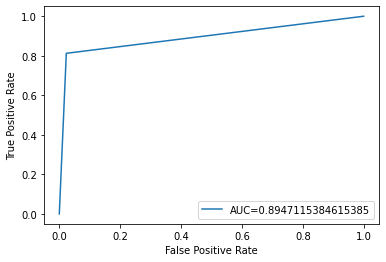

Validation set Accuracy: 0.9269662921348315

 -------------Classification Report-------------

              precision    recall  f1-score   support

         0.0       0.92      0.98      0.95       130
         1.0       0.95      0.77      0.85        48

    accuracy                           0.93       178
   macro avg       0.93      0.88      0.90       178
weighted avg       0.93      0.93      0.92       178

test set:
[[128   2]
 [ 11  37]]


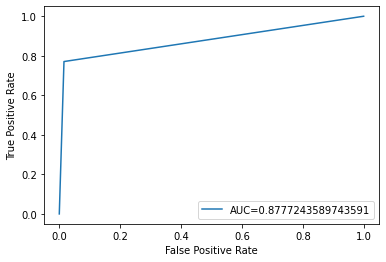

############################################################################################
############       F A S T   F E A T U R E  E N G G    A N D    S E L E C T I O N ! ########
# Be judicious with featurewiz. Don't use it to create too many un-interpretable features! #
############################################################################################
Skipping feature engineering since no feature_engg input...
Skipping category encoding since no category encoders specified in input...
**INFO: featurewiz can now read feather formatted files. Loading train data...
    Shape of your Data Set loaded: (532, 225)
    Loaded train data. Shape = (532, 225)
No test data filename given...
#######################################################################################
######################## C L A S S I F Y I N G  V A R I A B L E S  ####################
#######################################################################################
Classifying variables in data 

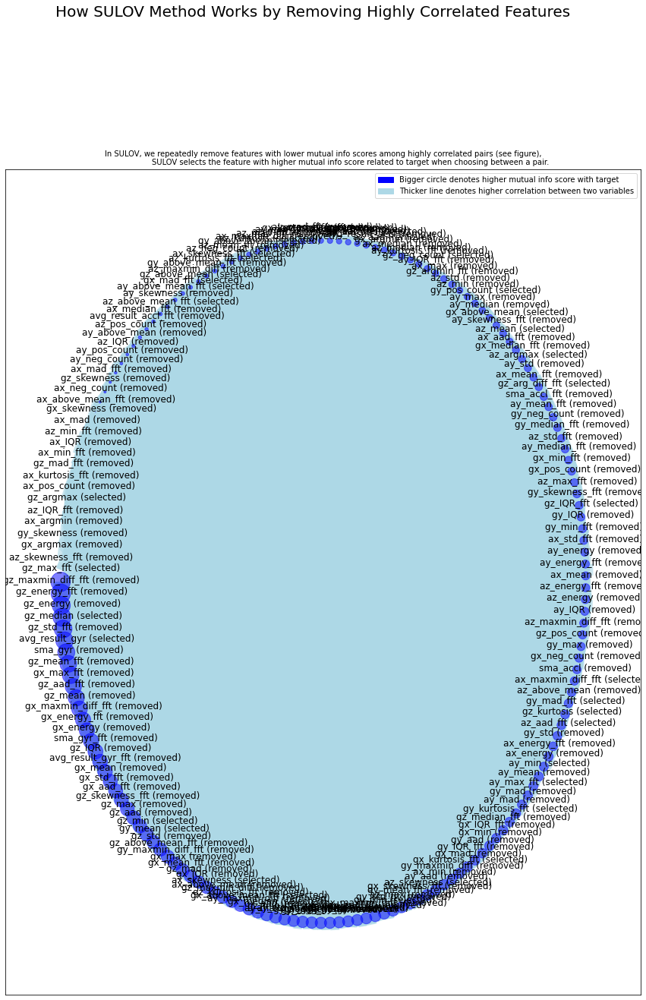

Time taken for SULOV method = 2 seconds
    Adding 0 categorical variables to reduced numeric variables  of 73
Final list of selected vars after SULOV = 73
Readying dataset for Recursive XGBoost by converting all features to numeric...
#######################################################################################
#####    R E C U R S I V E   X G B O O S T : F E A T U R E   S E L E C T I O N  #######
#######################################################################################
    using regular XGBoost
Train and Test loaded into Dask dataframes successfully after feature_engg completed
Current number of predictors = 73 
    XGBoost version: 1.6.1
Number of booster rounds = 100
        using 73 variables...
            Time taken for regular XGBoost feature selection = 0 seconds
        using 58 variables...
            Time taken for regular XGBoost feature selection = 0 seconds
        using 43 variables...
            Time taken for regular XGBoost feature selection

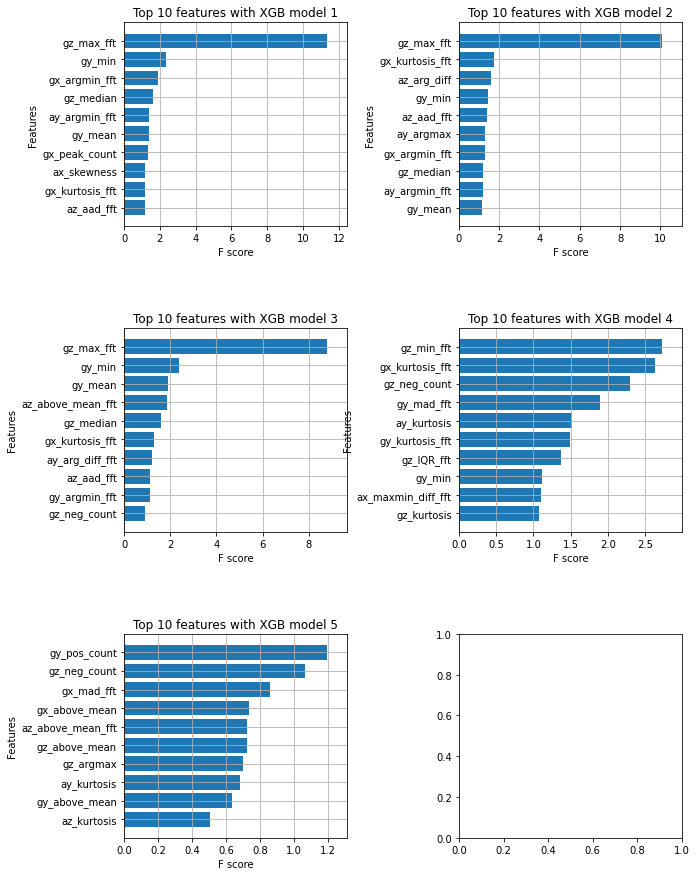

            Total time taken for XGBoost feature selection = 2 seconds
#######################################################################################
#####          F E A T U R E   S E L E C T I O N   C O M P L E T E D            #######
#######################################################################################
Selected 54 important features. Too many to print...

    Time taken for feature selection = 4 seconds
Returning 2 dataframes: dataname and test_data with 54 important features.
top 10 features: /n
['gz_max_fft', 'gy_min', 'gx_argmin_fft', 'gz_median', 'ay_argmin_fft', 'gy_mean', 'gx_peak_count', 'ax_skewness', 'gx_kurtosis_fft', 'az_aad_fft']



 Random Forest - using top 10 features from individual model
test set Accuracy: 0.9382022471910112

 -------------Classification Report-------------

              precision    recall  f1-score   support

         0.0       0.93      0.98      0.96       130
         1.0       0.95      0.81      0.88        48

  

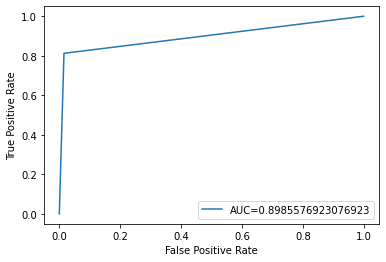

Validation set Accuracy: 0.9269662921348315

 -------------Classification Report-------------

              precision    recall  f1-score   support

         0.0       0.92      0.98      0.95       130
         1.0       0.95      0.77      0.85        48

    accuracy                           0.93       178
   macro avg       0.93      0.88      0.90       178
weighted avg       0.93      0.93      0.92       178

test set:
[[128   2]
 [ 11  37]]


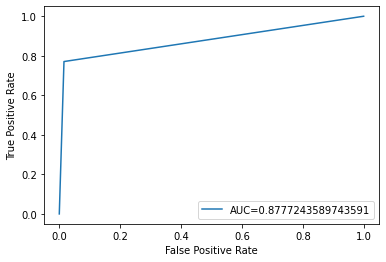

DP
left
HRP
left

 Random Forest - using top 10 features from global model
test set Accuracy: 0.8443983402489627

 -------------Classification Report-------------

              precision    recall  f1-score   support

         0.0       0.75      0.57      0.64       120
         1.0       0.87      0.94      0.90       362

    accuracy                           0.84       482
   macro avg       0.81      0.75      0.77       482
weighted avg       0.84      0.84      0.84       482

test set:
[[ 68  52]
 [ 23 339]]


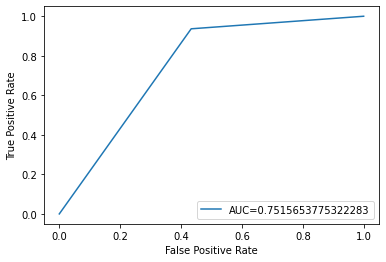

Validation set Accuracy: 0.8464730290456431

 -------------Classification Report-------------

              precision    recall  f1-score   support

         0.0       0.79      0.51      0.62       119
         1.0       0.86      0.96      0.90       363

    accuracy                           0.85       482
   macro avg       0.82      0.73      0.76       482
weighted avg       0.84      0.85      0.83       482

test set:
[[ 61  58]
 [ 16 347]]


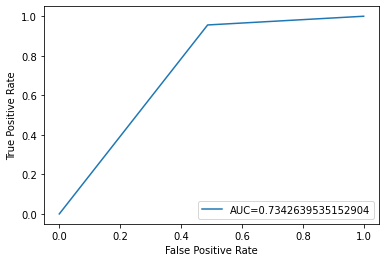

############################################################################################
############       F A S T   F E A T U R E  E N G G    A N D    S E L E C T I O N ! ########
# Be judicious with featurewiz. Don't use it to create too many un-interpretable features! #
############################################################################################
Skipping feature engineering since no feature_engg input...
Skipping category encoding since no category encoders specified in input...
**INFO: featurewiz can now read feather formatted files. Loading train data...
    Shape of your Data Set loaded: (1446, 225)
    Loaded train data. Shape = (1446, 225)
No test data filename given...
#######################################################################################
######################## C L A S S I F Y I N G  V A R I A B L E S  ####################
#######################################################################################
Classifying variables in dat

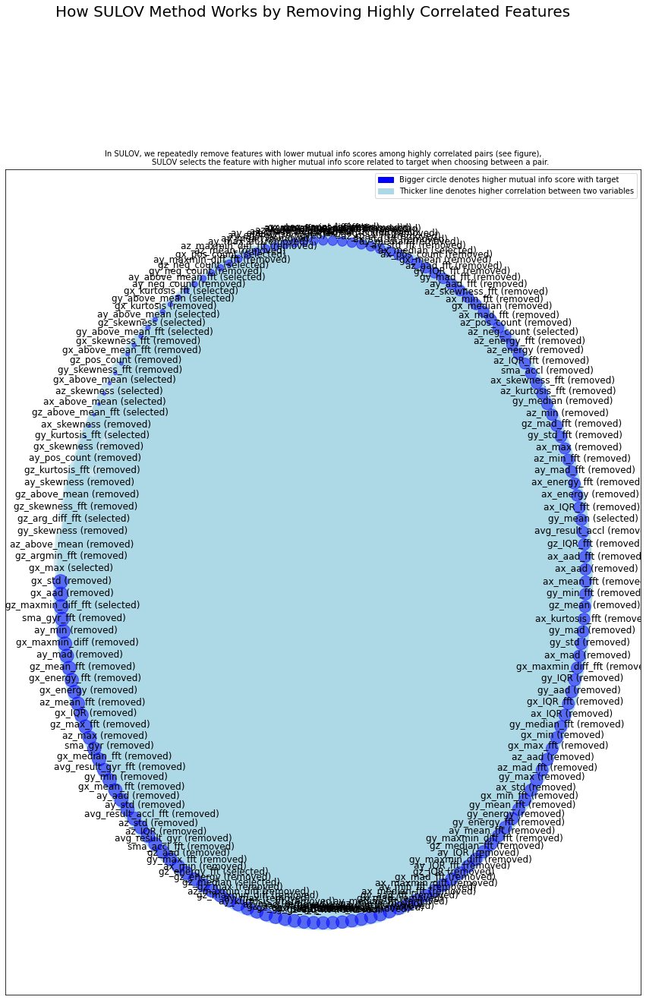

Time taken for SULOV method = 3 seconds
    Adding 0 categorical variables to reduced numeric variables  of 70
Final list of selected vars after SULOV = 70
Readying dataset for Recursive XGBoost by converting all features to numeric...
#######################################################################################
#####    R E C U R S I V E   X G B O O S T : F E A T U R E   S E L E C T I O N  #######
#######################################################################################
    using regular XGBoost
Train and Test loaded into Dask dataframes successfully after feature_engg completed
Current number of predictors = 70 
    XGBoost version: 1.6.1
Number of booster rounds = 100
        using 70 variables...
            Time taken for regular XGBoost feature selection = 0 seconds
        using 56 variables...
            Time taken for regular XGBoost feature selection = 1 seconds
        using 42 variables...
            Time taken for regular XGBoost feature selection

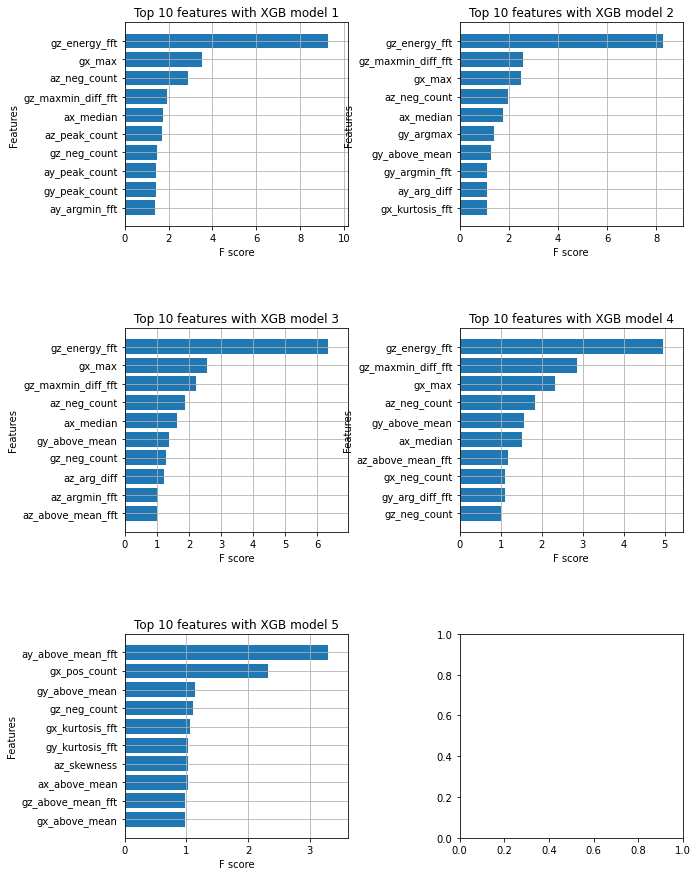

            Total time taken for XGBoost feature selection = 3 seconds
#######################################################################################
#####          F E A T U R E   S E L E C T I O N   C O M P L E T E D            #######
#######################################################################################
Selected 58 important features. Too many to print...

    Time taken for feature selection = 7 seconds
Returning 2 dataframes: dataname and test_data with 58 important features.
top 10 features: /n
['gz_energy_fft', 'gx_max', 'az_neg_count', 'gz_maxmin_diff_fft', 'ax_median', 'az_peak_count', 'gz_neg_count', 'ay_peak_count', 'gy_peak_count', 'ay_argmin_fft']



 Random Forest - using top 10 features from individual model
test set Accuracy: 0.8402489626556017

 -------------Classification Report-------------

              precision    recall  f1-score   support

         0.0       0.72      0.58      0.65       120
         1.0       0.87      0.93      0.9

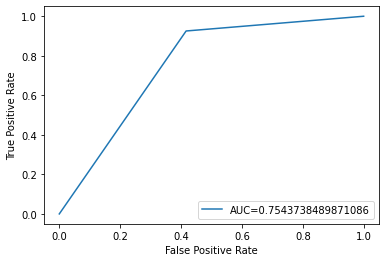

Validation set Accuracy: 0.8423236514522822

 -------------Classification Report-------------

              precision    recall  f1-score   support

         0.0       0.81      0.47      0.60       119
         1.0       0.85      0.96      0.90       363

    accuracy                           0.84       482
   macro avg       0.83      0.72      0.75       482
weighted avg       0.84      0.84      0.83       482

test set:
[[ 56  63]
 [ 13 350]]


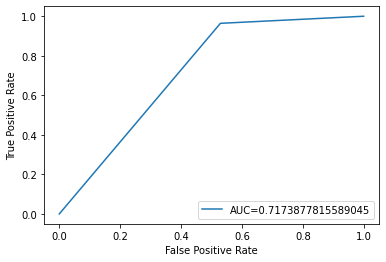

Right

 Random Forest - using top 10 features from global model
test set Accuracy: 0.8651452282157677

 -------------Classification Report-------------

              precision    recall  f1-score   support

         0.0       0.78      0.63      0.70       120
         1.0       0.89      0.94      0.91       362

    accuracy                           0.87       482
   macro avg       0.83      0.79      0.81       482
weighted avg       0.86      0.87      0.86       482

test set:
[[ 76  44]
 [ 21 341]]


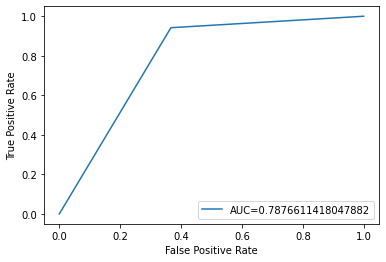

Validation set Accuracy: 0.8692946058091287

 -------------Classification Report-------------

              precision    recall  f1-score   support

         0.0       0.82      0.61      0.70       119
         1.0       0.88      0.96      0.92       363

    accuracy                           0.87       482
   macro avg       0.85      0.78      0.81       482
weighted avg       0.87      0.87      0.86       482

test set:
[[ 72  47]
 [ 16 347]]


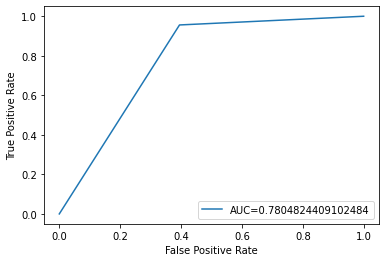

############################################################################################
############       F A S T   F E A T U R E  E N G G    A N D    S E L E C T I O N ! ########
# Be judicious with featurewiz. Don't use it to create too many un-interpretable features! #
############################################################################################
Skipping feature engineering since no feature_engg input...
Skipping category encoding since no category encoders specified in input...
**INFO: featurewiz can now read feather formatted files. Loading train data...
    Shape of your Data Set loaded: (1446, 225)
    Loaded train data. Shape = (1446, 225)
No test data filename given...
#######################################################################################
######################## C L A S S I F Y I N G  V A R I A B L E S  ####################
#######################################################################################
Classifying variables in dat

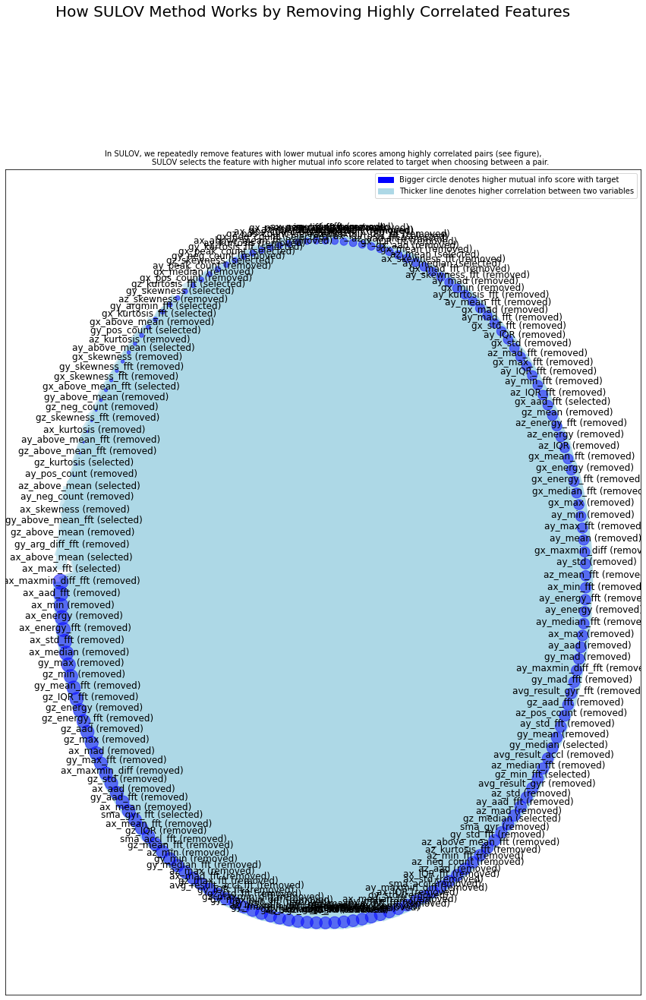

Time taken for SULOV method = 4 seconds
    Adding 0 categorical variables to reduced numeric variables  of 64
Final list of selected vars after SULOV = 64
Readying dataset for Recursive XGBoost by converting all features to numeric...
#######################################################################################
#####    R E C U R S I V E   X G B O O S T : F E A T U R E   S E L E C T I O N  #######
#######################################################################################
    using regular XGBoost
Train and Test loaded into Dask dataframes successfully after feature_engg completed
Current number of predictors = 64 
    XGBoost version: 1.6.1
Number of booster rounds = 100
        using 64 variables...
            Time taken for regular XGBoost feature selection = 1 seconds
        using 51 variables...
            Time taken for regular XGBoost feature selection = 1 seconds
        using 38 variables...
            Time taken for regular XGBoost feature selection

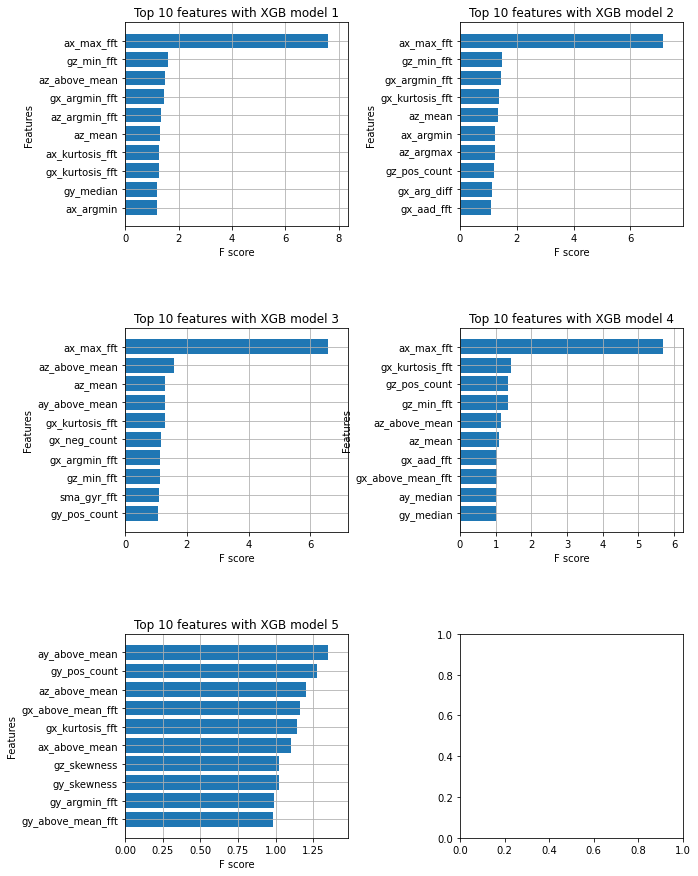

            Total time taken for XGBoost feature selection = 3 seconds
#######################################################################################
#####          F E A T U R E   S E L E C T I O N   C O M P L E T E D            #######
#######################################################################################
Selected 46 important features. Too many to print...

    Time taken for feature selection = 7 seconds
Returning 2 dataframes: dataname and test_data with 46 important features.
top 10 features: /n
['ax_max_fft', 'gz_min_fft', 'az_above_mean', 'gx_argmin_fft', 'az_argmin_fft', 'az_mean', 'ax_kurtosis_fft', 'gx_kurtosis_fft', 'gy_median', 'ax_argmin']



 Random Forest - using top 10 features from individual model
test set Accuracy: 0.8672199170124482

 -------------Classification Report-------------

              precision    recall  f1-score   support

         0.0       0.77      0.66      0.71       120
         1.0       0.89      0.94      0.91       

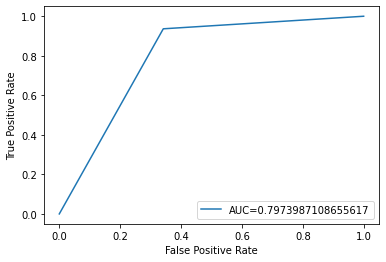

Validation set Accuracy: 0.8692946058091287

 -------------Classification Report-------------

              precision    recall  f1-score   support

         0.0       0.83      0.59      0.69       119
         1.0       0.88      0.96      0.92       363

    accuracy                           0.87       482
   macro avg       0.86      0.77      0.80       482
weighted avg       0.87      0.87      0.86       482

test set:
[[ 70  49]
 [ 14 349]]


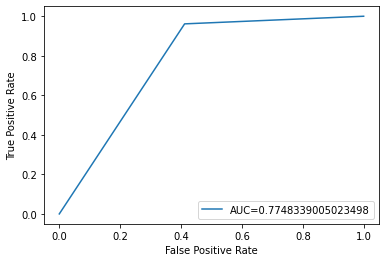

KS
left

 Random Forest - using top 10 features from global model
test set Accuracy: 0.9120879120879121

 -------------Classification Report-------------

              precision    recall  f1-score   support

         0.0       0.92      0.99      0.95       244
         1.0       0.78      0.24      0.37        29

    accuracy                           0.91       273
   macro avg       0.85      0.62      0.66       273
weighted avg       0.90      0.91      0.89       273

test set:
[[242   2]
 [ 22   7]]


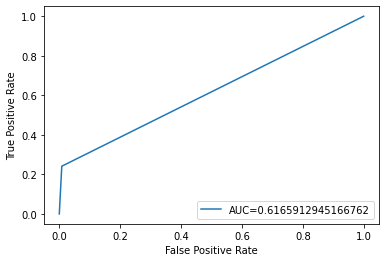

Validation set Accuracy: 0.9157509157509157

 -------------Classification Report-------------

              precision    recall  f1-score   support

         0.0       0.92      0.99      0.95       244
         1.0       0.80      0.28      0.41        29

    accuracy                           0.92       273
   macro avg       0.86      0.63      0.68       273
weighted avg       0.91      0.92      0.90       273

test set:
[[242   2]
 [ 21   8]]


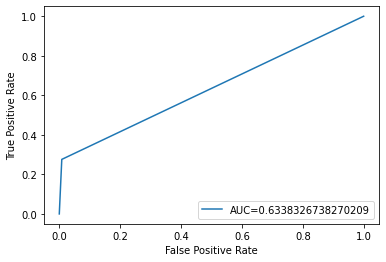

############################################################################################
############       F A S T   F E A T U R E  E N G G    A N D    S E L E C T I O N ! ########
# Be judicious with featurewiz. Don't use it to create too many un-interpretable features! #
############################################################################################
Skipping feature engineering since no feature_engg input...
Skipping category encoding since no category encoders specified in input...
**INFO: featurewiz can now read feather formatted files. Loading train data...
    Shape of your Data Set loaded: (819, 225)
    Loaded train data. Shape = (819, 225)
No test data filename given...
#######################################################################################
######################## C L A S S I F Y I N G  V A R I A B L E S  ####################
#######################################################################################
Classifying variables in data 

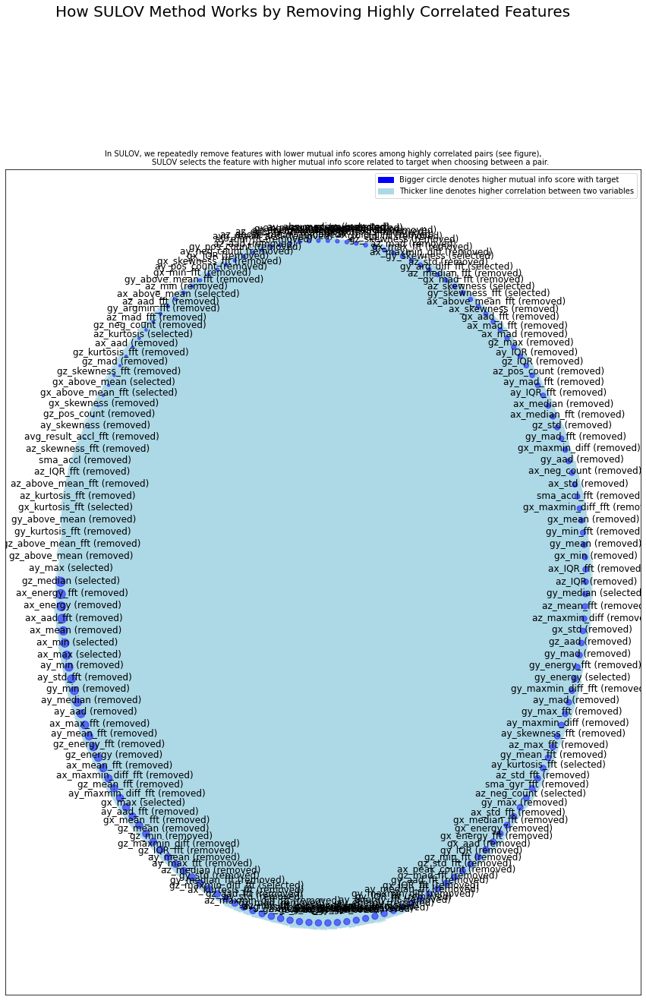

Time taken for SULOV method = 4 seconds
    Adding 0 categorical variables to reduced numeric variables  of 66
Final list of selected vars after SULOV = 66
Readying dataset for Recursive XGBoost by converting all features to numeric...
#######################################################################################
#####    R E C U R S I V E   X G B O O S T : F E A T U R E   S E L E C T I O N  #######
#######################################################################################
    using regular XGBoost
Train and Test loaded into Dask dataframes successfully after feature_engg completed
Current number of predictors = 66 
    XGBoost version: 1.6.1
Number of booster rounds = 100
        using 66 variables...
            Time taken for regular XGBoost feature selection = 0 seconds
        using 53 variables...
            Time taken for regular XGBoost feature selection = 0 seconds
        using 40 variables...
            Time taken for regular XGBoost feature selection

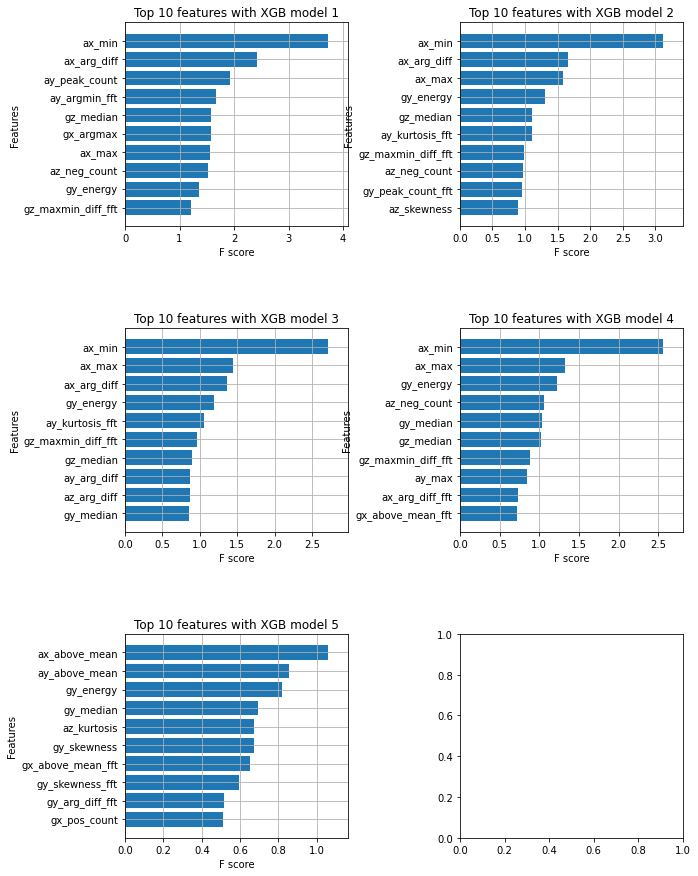

            Total time taken for XGBoost feature selection = 2 seconds
#######################################################################################
#####          F E A T U R E   S E L E C T I O N   C O M P L E T E D            #######
#######################################################################################
Selected 53 important features. Too many to print...

    Time taken for feature selection = 6 seconds
Returning 2 dataframes: dataname and test_data with 53 important features.
top 10 features: /n
['ax_min', 'ax_arg_diff', 'ay_peak_count', 'ay_argmin_fft', 'gz_median', 'gx_argmax', 'ax_max', 'az_neg_count', 'gy_energy', 'gz_maxmin_diff_fft']



 Random Forest - using top 10 features from individual model
test set Accuracy: 0.9047619047619048

 -------------Classification Report-------------

              precision    recall  f1-score   support

         0.0       0.92      0.98      0.95       244
         1.0       0.60      0.31      0.41        29

   

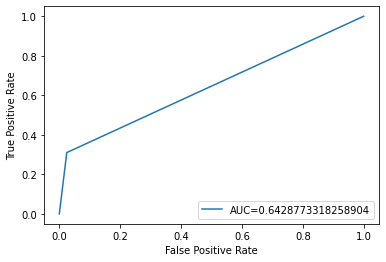

Validation set Accuracy: 0.8937728937728938

 -------------Classification Report-------------

              precision    recall  f1-score   support

         0.0       0.92      0.97      0.94       244
         1.0       0.50      0.24      0.33        29

    accuracy                           0.89       273
   macro avg       0.71      0.61      0.63       273
weighted avg       0.87      0.89      0.88       273

test set:
[[237   7]
 [ 22   7]]


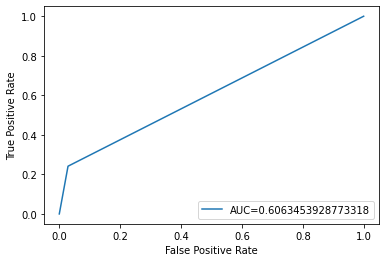

Right

 Random Forest - using top 10 features from global model
test set Accuracy: 0.9120879120879121

 -------------Classification Report-------------

              precision    recall  f1-score   support

         0.0       0.92      0.99      0.95       244
         1.0       0.73      0.28      0.40        29

    accuracy                           0.91       273
   macro avg       0.82      0.63      0.68       273
weighted avg       0.90      0.91      0.89       273

test set:
[[241   3]
 [ 21   8]]


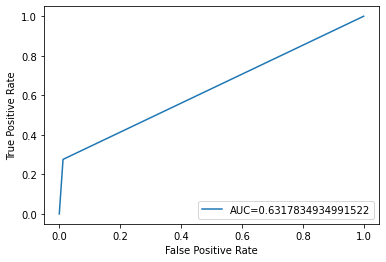

Validation set Accuracy: 0.9084249084249084

 -------------Classification Report-------------

              precision    recall  f1-score   support

         0.0       0.91      0.99      0.95       244
         1.0       0.75      0.21      0.32        29

    accuracy                           0.91       273
   macro avg       0.83      0.60      0.64       273
weighted avg       0.90      0.91      0.88       273

test set:
[[242   2]
 [ 23   6]]


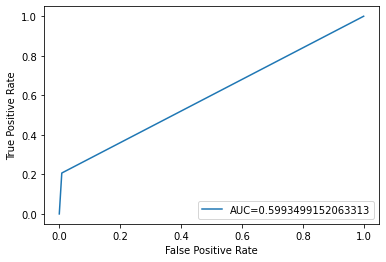

############################################################################################
############       F A S T   F E A T U R E  E N G G    A N D    S E L E C T I O N ! ########
# Be judicious with featurewiz. Don't use it to create too many un-interpretable features! #
############################################################################################
Skipping feature engineering since no feature_engg input...
Skipping category encoding since no category encoders specified in input...
**INFO: featurewiz can now read feather formatted files. Loading train data...
    Shape of your Data Set loaded: (819, 225)
    Loaded train data. Shape = (819, 225)
No test data filename given...
#######################################################################################
######################## C L A S S I F Y I N G  V A R I A B L E S  ####################
#######################################################################################
Classifying variables in data 

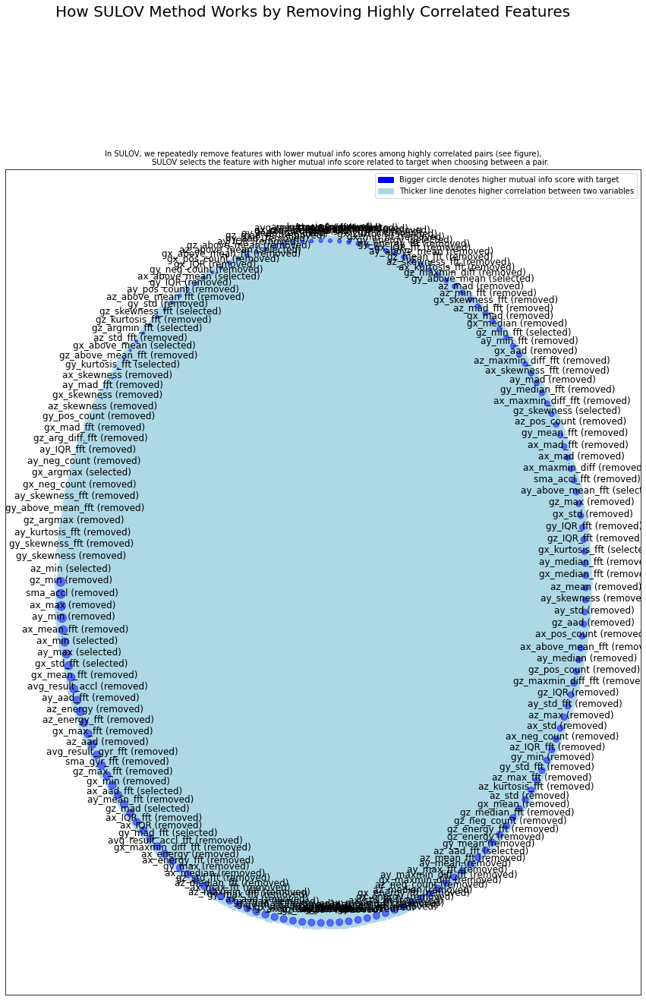

Time taken for SULOV method = 3 seconds
    Adding 0 categorical variables to reduced numeric variables  of 67
Final list of selected vars after SULOV = 67
Readying dataset for Recursive XGBoost by converting all features to numeric...
#######################################################################################
#####    R E C U R S I V E   X G B O O S T : F E A T U R E   S E L E C T I O N  #######
#######################################################################################
    using regular XGBoost
Train and Test loaded into Dask dataframes successfully after feature_engg completed
Current number of predictors = 67 
    XGBoost version: 1.6.1
Number of booster rounds = 100
        using 67 variables...
            Time taken for regular XGBoost feature selection = 0 seconds
        using 54 variables...
            Time taken for regular XGBoost feature selection = 1 seconds
        using 41 variables...
            Time taken for regular XGBoost feature selection

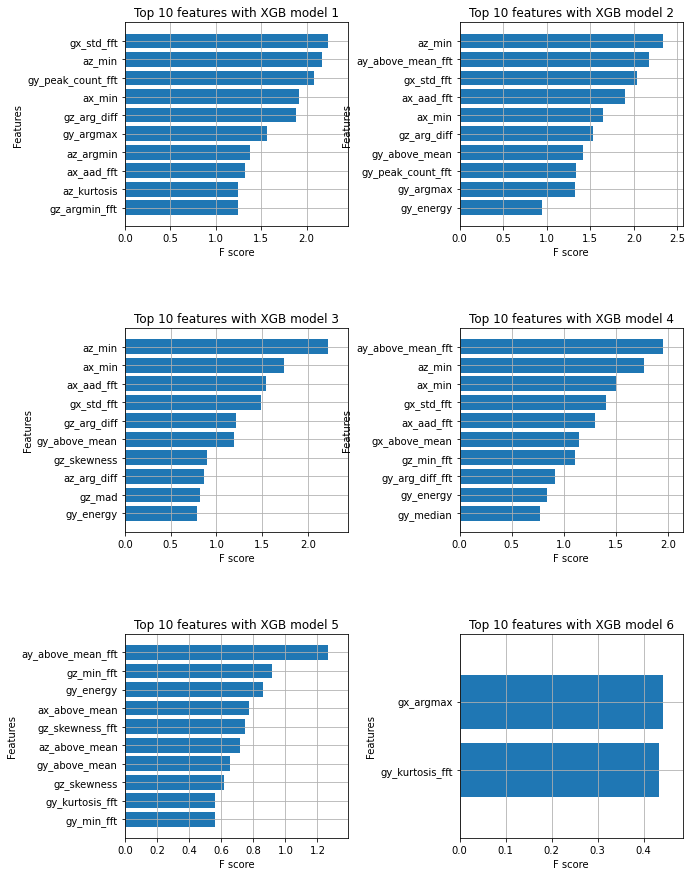

            Total time taken for XGBoost feature selection = 3 seconds
#######################################################################################
#####          F E A T U R E   S E L E C T I O N   C O M P L E T E D            #######
#######################################################################################
Selected 52 important features. Too many to print...

    Time taken for feature selection = 6 seconds
Returning 2 dataframes: dataname and test_data with 52 important features.
top 10 features: /n
['gx_std_fft', 'az_min', 'gy_peak_count_fft', 'ax_min', 'gz_arg_diff', 'gy_argmax', 'az_argmin', 'ax_aad_fft', 'az_kurtosis', 'gz_argmin_fft']



 Random Forest - using top 10 features from individual model
test set Accuracy: 0.9010989010989011

 -------------Classification Report-------------

              precision    recall  f1-score   support

         0.0       0.90      1.00      0.95       244
         1.0       1.00      0.07      0.13        29

    acc

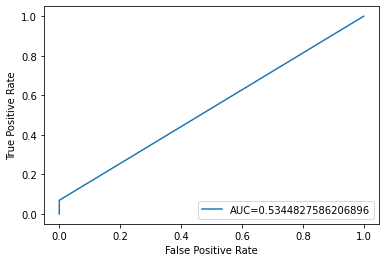

Validation set Accuracy: 0.8974358974358975

 -------------Classification Report-------------

              precision    recall  f1-score   support

         0.0       0.91      0.99      0.95       244
         1.0       0.57      0.14      0.22        29

    accuracy                           0.90       273
   macro avg       0.74      0.56      0.58       273
weighted avg       0.87      0.90      0.87       273

test set:
[[241   3]
 [ 25   4]]


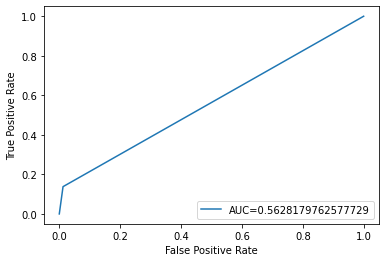

MT
left

 Random Forest - using top 10 features from global model
test set Accuracy: 0.983739837398374

 -------------Classification Report-------------

              precision    recall  f1-score   support

         0.0       0.98      1.00      0.99       121
         1.0       0.00      0.00      0.00         2

    accuracy                           0.98       123
   macro avg       0.49      0.50      0.50       123
weighted avg       0.97      0.98      0.98       123

test set:
[[121   0]
 [  2   0]]


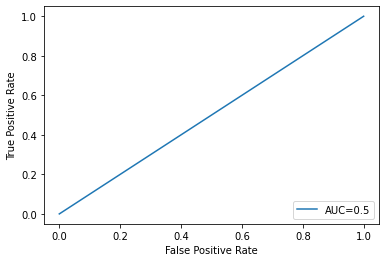

Validation set Accuracy: 0.983739837398374

 -------------Classification Report-------------

              precision    recall  f1-score   support

         0.0       0.98      1.00      0.99       121
         1.0       0.00      0.00      0.00         2

    accuracy                           0.98       123
   macro avg       0.49      0.50      0.50       123
weighted avg       0.97      0.98      0.98       123

test set:
[[121   0]
 [  2   0]]


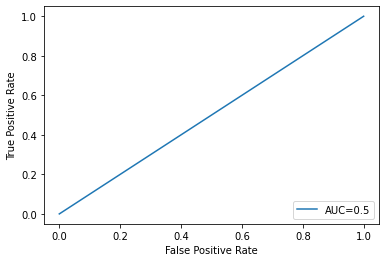

############################################################################################
############       F A S T   F E A T U R E  E N G G    A N D    S E L E C T I O N ! ########
# Be judicious with featurewiz. Don't use it to create too many un-interpretable features! #
############################################################################################
Skipping feature engineering since no feature_engg input...
Skipping category encoding since no category encoders specified in input...
**INFO: featurewiz can now read feather formatted files. Loading train data...
    Shape of your Data Set loaded: (369, 225)
    Loaded train data. Shape = (369, 225)
No test data filename given...
#######################################################################################
######################## C L A S S I F Y I N G  V A R I A B L E S  ####################
#######################################################################################
Classifying variables in data 

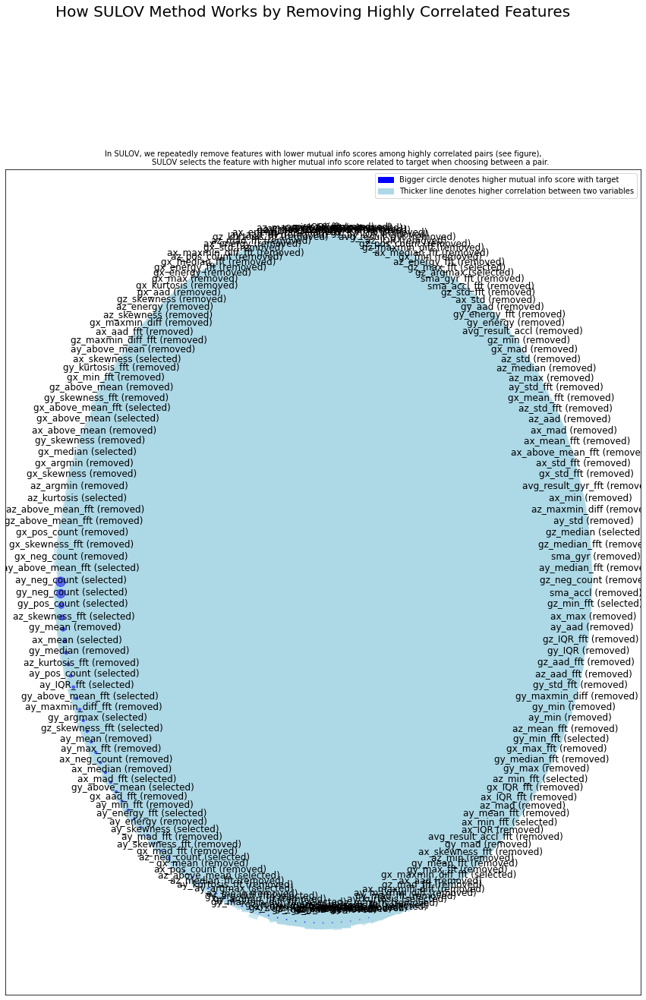

Time taken for SULOV method = 4 seconds
    Adding 0 categorical variables to reduced numeric variables  of 74
Final list of selected vars after SULOV = 74
Readying dataset for Recursive XGBoost by converting all features to numeric...
#######################################################################################
#####    R E C U R S I V E   X G B O O S T : F E A T U R E   S E L E C T I O N  #######
#######################################################################################
    using regular XGBoost
Train and Test loaded into Dask dataframes successfully after feature_engg completed
Current number of predictors = 74 
    XGBoost version: 1.6.1
Number of booster rounds = 100
        using 74 variables...
            Time taken for regular XGBoost feature selection = 0 seconds
        using 59 variables...
            Time taken for regular XGBoost feature selection = 0 seconds
        using 44 variables...
            Time taken for regular XGBoost feature selection

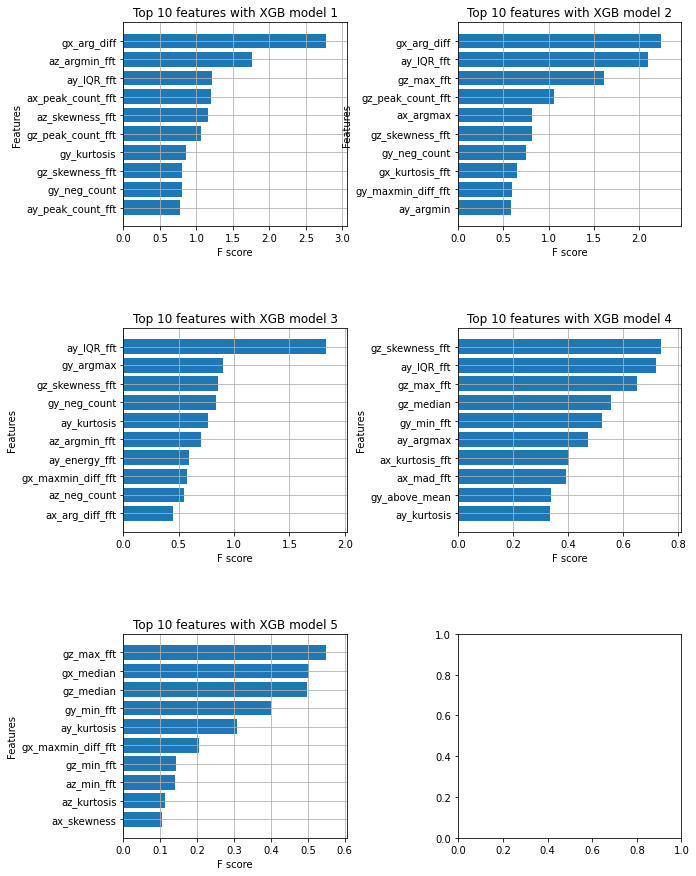

            Total time taken for XGBoost feature selection = 2 seconds
#######################################################################################
#####          F E A T U R E   S E L E C T I O N   C O M P L E T E D            #######
#######################################################################################
Selected 52 important features. Too many to print...

    Time taken for feature selection = 7 seconds
Returning 2 dataframes: dataname and test_data with 52 important features.
top 10 features: /n
['gx_arg_diff', 'az_argmin_fft', 'ay_IQR_fft', 'ax_peak_count_fft', 'az_skewness_fft', 'gz_peak_count_fft', 'gy_kurtosis', 'gz_skewness_fft', 'gy_neg_count', 'ay_peak_count_fft']



 Random Forest - using top 10 features from individual model
test set Accuracy: 0.983739837398374

 -------------Classification Report-------------

              precision    recall  f1-score   support

         0.0       0.98      1.00      0.99       121
         1.0       0.00    

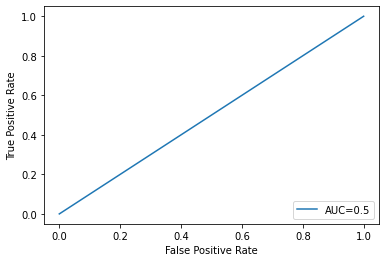

Validation set Accuracy: 0.983739837398374

 -------------Classification Report-------------

              precision    recall  f1-score   support

         0.0       0.98      1.00      0.99       121
         1.0       0.00      0.00      0.00         2

    accuracy                           0.98       123
   macro avg       0.49      0.50      0.50       123
weighted avg       0.97      0.98      0.98       123

test set:
[[121   0]
 [  2   0]]


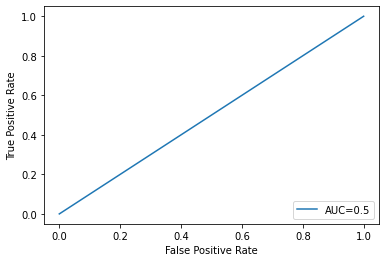

Right

 Random Forest - using top 10 features from global model
test set Accuracy: 0.983739837398374

 -------------Classification Report-------------

              precision    recall  f1-score   support

         0.0       0.98      1.00      0.99       121
         1.0       0.00      0.00      0.00         2

    accuracy                           0.98       123
   macro avg       0.49      0.50      0.50       123
weighted avg       0.97      0.98      0.98       123

test set:
[[121   0]
 [  2   0]]


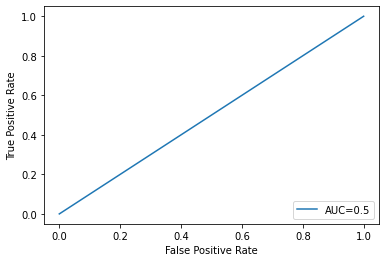

Validation set Accuracy: 0.975609756097561

 -------------Classification Report-------------

              precision    recall  f1-score   support

         0.0       0.98      0.99      0.99       121
         1.0       0.00      0.00      0.00         2

    accuracy                           0.98       123
   macro avg       0.49      0.50      0.49       123
weighted avg       0.97      0.98      0.97       123

test set:
[[120   1]
 [  2   0]]


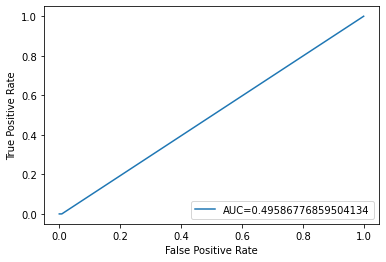

############################################################################################
############       F A S T   F E A T U R E  E N G G    A N D    S E L E C T I O N ! ########
# Be judicious with featurewiz. Don't use it to create too many un-interpretable features! #
############################################################################################
Skipping feature engineering since no feature_engg input...
Skipping category encoding since no category encoders specified in input...
**INFO: featurewiz can now read feather formatted files. Loading train data...
    Shape of your Data Set loaded: (369, 225)
    Loaded train data. Shape = (369, 225)
No test data filename given...
#######################################################################################
######################## C L A S S I F Y I N G  V A R I A B L E S  ####################
#######################################################################################
Classifying variables in data 

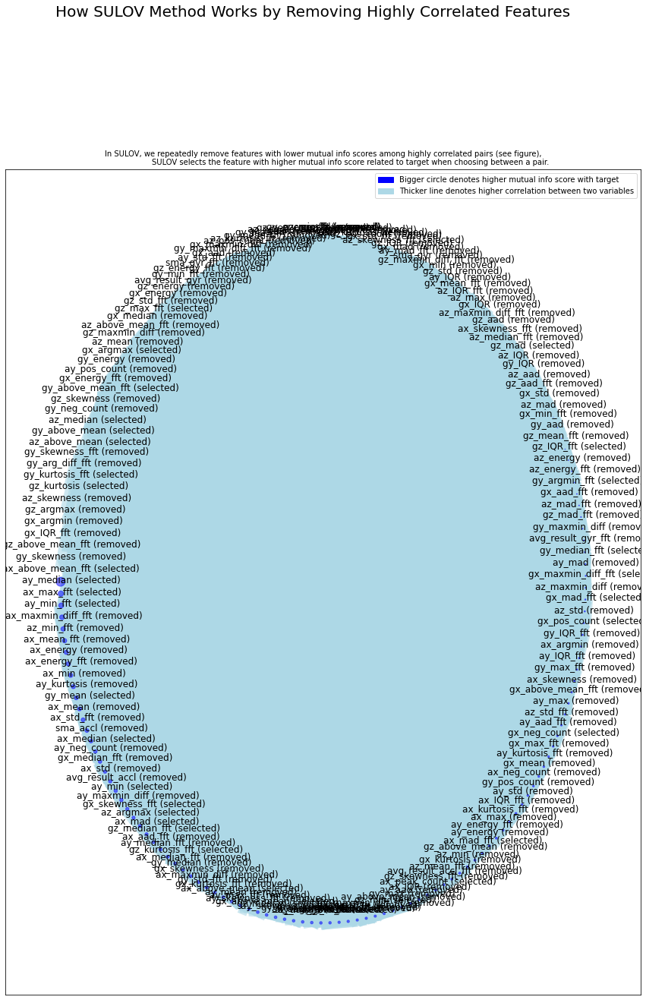

Time taken for SULOV method = 5 seconds
    Adding 0 categorical variables to reduced numeric variables  of 75
Final list of selected vars after SULOV = 75
Readying dataset for Recursive XGBoost by converting all features to numeric...
#######################################################################################
#####    R E C U R S I V E   X G B O O S T : F E A T U R E   S E L E C T I O N  #######
#######################################################################################
    using regular XGBoost
Train and Test loaded into Dask dataframes successfully after feature_engg completed
Current number of predictors = 75 
    XGBoost version: 1.6.1
Number of booster rounds = 100
        using 75 variables...
            Time taken for regular XGBoost feature selection = 0 seconds
        using 60 variables...
            Time taken for regular XGBoost feature selection = 0 seconds
        using 45 variables...
            Time taken for regular XGBoost feature selection

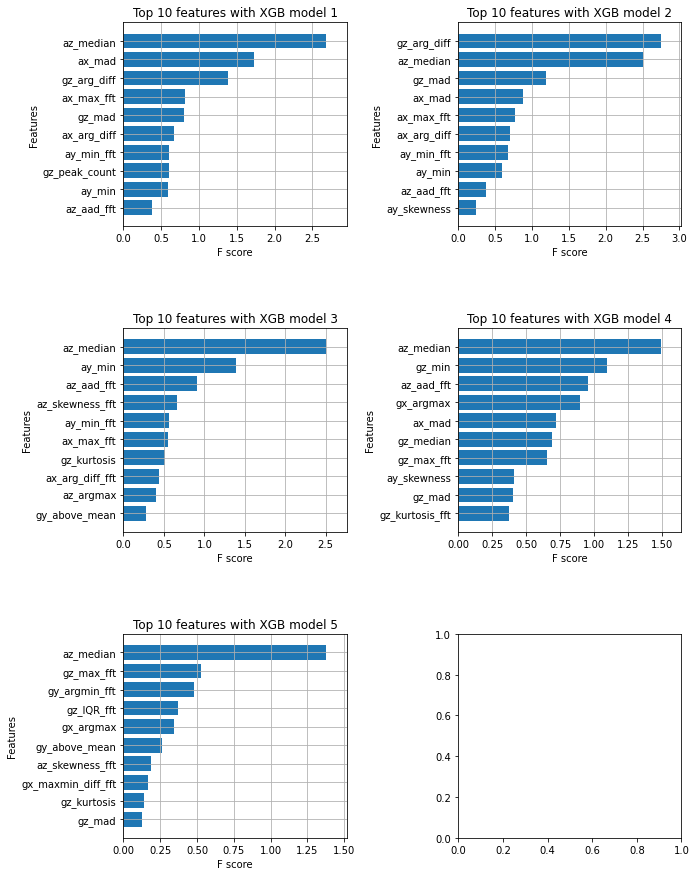

            Total time taken for XGBoost feature selection = 1 seconds
#######################################################################################
#####          F E A T U R E   S E L E C T I O N   C O M P L E T E D            #######
#######################################################################################
Selected 44 important features. Too many to print...

    Time taken for feature selection = 6 seconds
Returning 2 dataframes: dataname and test_data with 44 important features.
top 10 features: /n
['az_median', 'ax_mad', 'gz_arg_diff', 'ax_max_fft', 'gz_mad', 'ax_arg_diff', 'ay_min_fft', 'gz_peak_count', 'ay_min', 'az_aad_fft']



 Random Forest - using top 10 features from individual model
test set Accuracy: 0.983739837398374

 -------------Classification Report-------------

              precision    recall  f1-score   support

         0.0       0.98      1.00      0.99       121
         1.0       0.00      0.00      0.00         2

    accuracy      

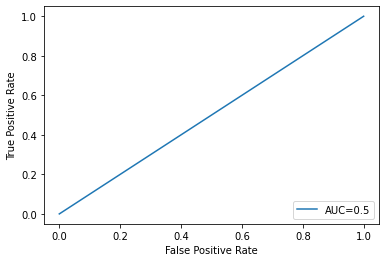

Validation set Accuracy: 0.983739837398374

 -------------Classification Report-------------

              precision    recall  f1-score   support

         0.0       0.98      1.00      0.99       121
         1.0       0.00      0.00      0.00         2

    accuracy                           0.98       123
   macro avg       0.49      0.50      0.50       123
weighted avg       0.97      0.98      0.98       123

test set:
[[121   0]
 [  2   0]]


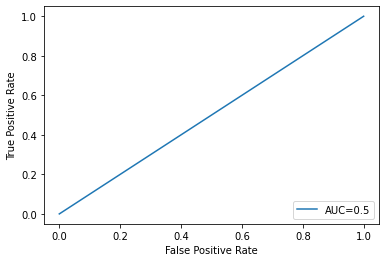

PJ
left

 Random Forest - using top 10 features from global model
test set Accuracy: 0.9138321995464853

 -------------Classification Report-------------

              precision    recall  f1-score   support

         0.0       0.91      1.00      0.95       403
         1.0       0.00      0.00      0.00        38

    accuracy                           0.91       441
   macro avg       0.46      0.50      0.48       441
weighted avg       0.84      0.91      0.87       441

test set:
[[403   0]
 [ 38   0]]


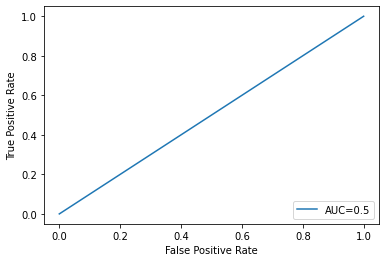

Validation set Accuracy: 0.9140271493212669

 -------------Classification Report-------------

              precision    recall  f1-score   support

         0.0       0.91      1.00      0.96       404
         1.0       0.00      0.00      0.00        38

    accuracy                           0.91       442
   macro avg       0.46      0.50      0.48       442
weighted avg       0.84      0.91      0.87       442

test set:
[[404   0]
 [ 38   0]]


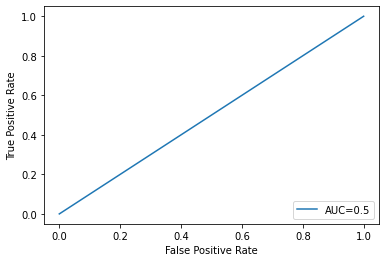

############################################################################################
############       F A S T   F E A T U R E  E N G G    A N D    S E L E C T I O N ! ########
# Be judicious with featurewiz. Don't use it to create too many un-interpretable features! #
############################################################################################
Skipping feature engineering since no feature_engg input...
Skipping category encoding since no category encoders specified in input...
**INFO: featurewiz can now read feather formatted files. Loading train data...
    Shape of your Data Set loaded: (1324, 225)
    Loaded train data. Shape = (1324, 225)
No test data filename given...
#######################################################################################
######################## C L A S S I F Y I N G  V A R I A B L E S  ####################
#######################################################################################
Classifying variables in dat

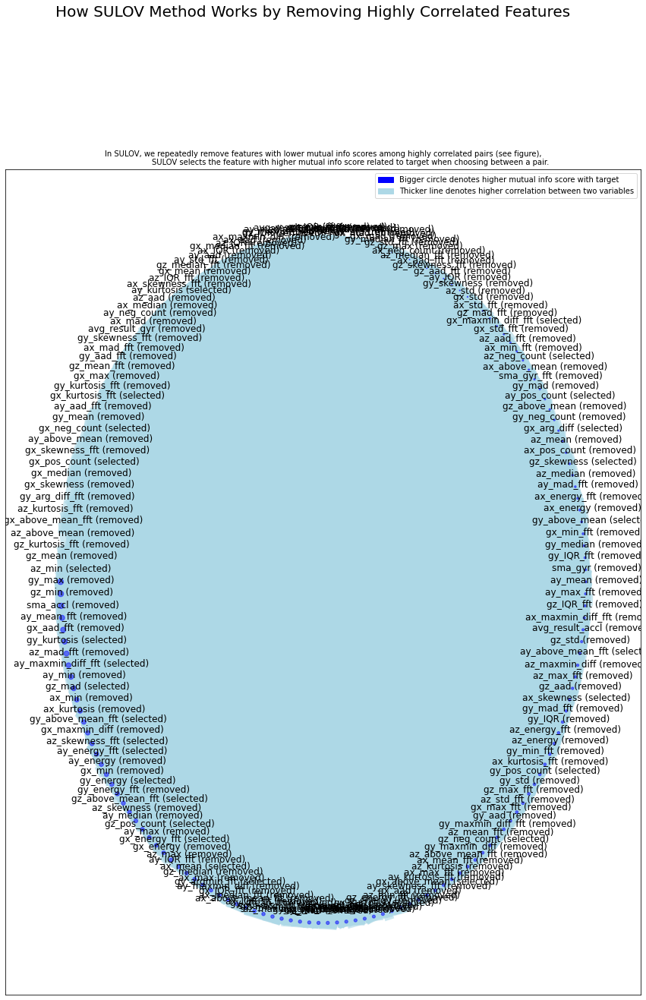

Time taken for SULOV method = 4 seconds
    Adding 0 categorical variables to reduced numeric variables  of 71
Final list of selected vars after SULOV = 71
Readying dataset for Recursive XGBoost by converting all features to numeric...
#######################################################################################
#####    R E C U R S I V E   X G B O O S T : F E A T U R E   S E L E C T I O N  #######
#######################################################################################
    using regular XGBoost
Train and Test loaded into Dask dataframes successfully after feature_engg completed
Current number of predictors = 71 
    XGBoost version: 1.6.1
Number of booster rounds = 100
        using 71 variables...
            Time taken for regular XGBoost feature selection = 0 seconds
        using 57 variables...
            Time taken for regular XGBoost feature selection = 1 seconds
        using 43 variables...
            Time taken for regular XGBoost feature selection

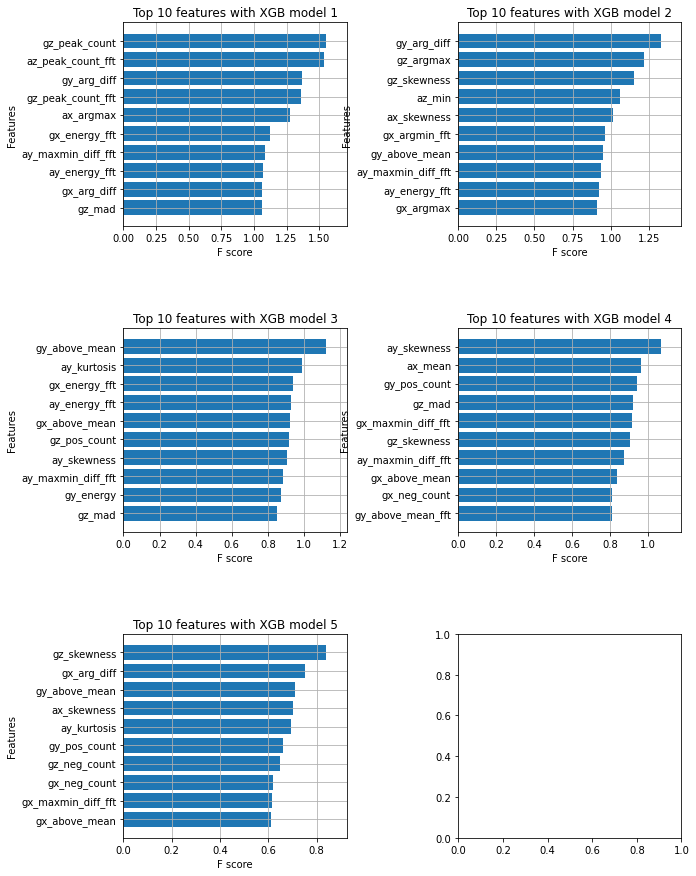

            Total time taken for XGBoost feature selection = 3 seconds
#######################################################################################
#####          F E A T U R E   S E L E C T I O N   C O M P L E T E D            #######
#######################################################################################
Selected 57 important features. Too many to print...

    Time taken for feature selection = 7 seconds
Returning 2 dataframes: dataname and test_data with 57 important features.
top 10 features: /n
['gz_peak_count', 'az_peak_count_fft', 'gy_arg_diff', 'gz_peak_count_fft', 'ax_argmax', 'gx_energy_fft', 'ay_maxmin_diff_fft', 'ay_energy_fft', 'gx_arg_diff', 'gz_mad']



 Random Forest - using top 10 features from individual model
test set Accuracy: 0.909297052154195

 -------------Classification Report-------------

              precision    recall  f1-score   support

         0.0       0.91      1.00      0.95       403
         1.0       0.00      0.00    

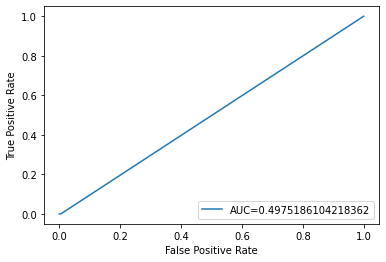

Validation set Accuracy: 0.9140271493212669

 -------------Classification Report-------------

              precision    recall  f1-score   support

         0.0       0.91      1.00      0.96       404
         1.0       0.00      0.00      0.00        38

    accuracy                           0.91       442
   macro avg       0.46      0.50      0.48       442
weighted avg       0.84      0.91      0.87       442

test set:
[[404   0]
 [ 38   0]]


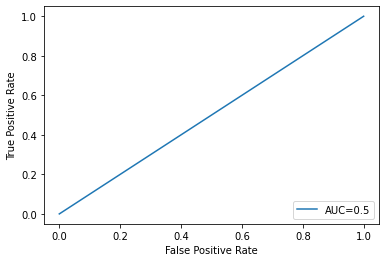

Right

 Random Forest - using top 10 features from global model
test set Accuracy: 0.9115646258503401

 -------------Classification Report-------------

              precision    recall  f1-score   support

         0.0       0.91      1.00      0.95       403
         1.0       0.00      0.00      0.00        38

    accuracy                           0.91       441
   macro avg       0.46      0.50      0.48       441
weighted avg       0.83      0.91      0.87       441

test set:
[[402   1]
 [ 38   0]]


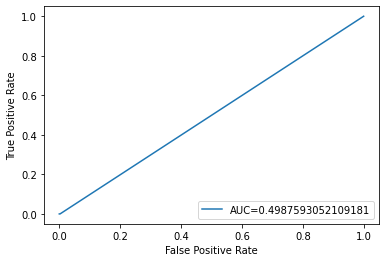

Validation set Accuracy: 0.9140271493212669

 -------------Classification Report-------------

              precision    recall  f1-score   support

         0.0       0.92      1.00      0.95       404
         1.0       0.50      0.03      0.05        38

    accuracy                           0.91       442
   macro avg       0.71      0.51      0.50       442
weighted avg       0.88      0.91      0.88       442

test set:
[[403   1]
 [ 37   1]]


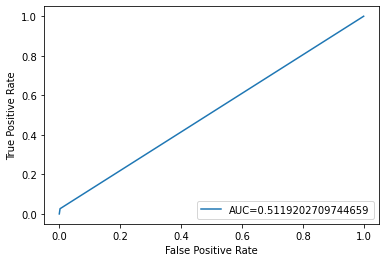

############################################################################################
############       F A S T   F E A T U R E  E N G G    A N D    S E L E C T I O N ! ########
# Be judicious with featurewiz. Don't use it to create too many un-interpretable features! #
############################################################################################
Skipping feature engineering since no feature_engg input...
Skipping category encoding since no category encoders specified in input...
**INFO: featurewiz can now read feather formatted files. Loading train data...
    Shape of your Data Set loaded: (1324, 225)
    Loaded train data. Shape = (1324, 225)
No test data filename given...
#######################################################################################
######################## C L A S S I F Y I N G  V A R I A B L E S  ####################
#######################################################################################
Classifying variables in dat

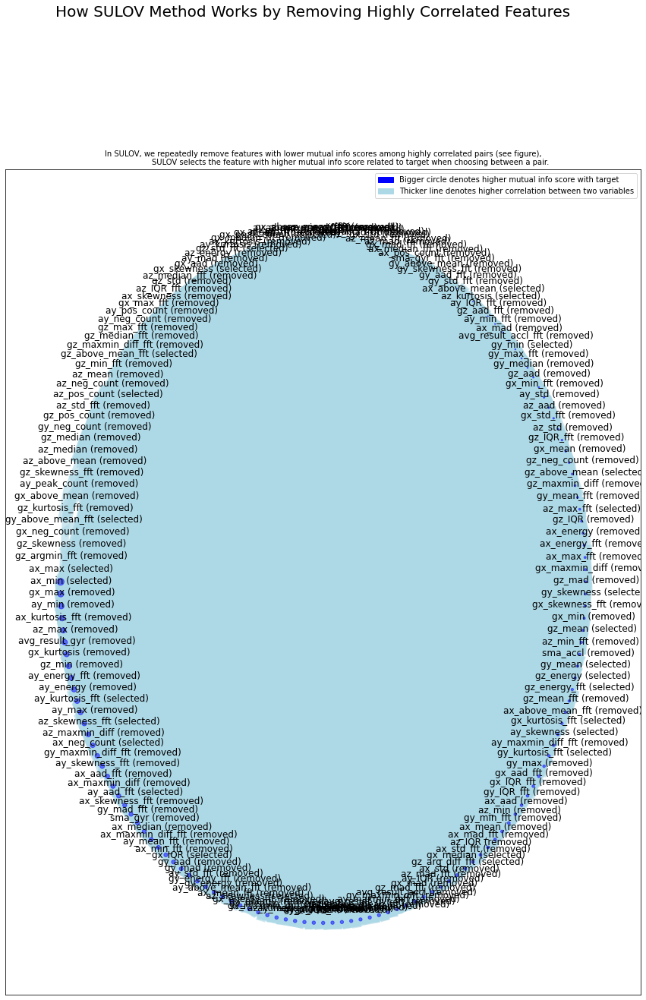

Time taken for SULOV method = 4 seconds
    Adding 0 categorical variables to reduced numeric variables  of 71
Final list of selected vars after SULOV = 71
Readying dataset for Recursive XGBoost by converting all features to numeric...
#######################################################################################
#####    R E C U R S I V E   X G B O O S T : F E A T U R E   S E L E C T I O N  #######
#######################################################################################
    using regular XGBoost
Train and Test loaded into Dask dataframes successfully after feature_engg completed
Current number of predictors = 71 
    XGBoost version: 1.6.1
Number of booster rounds = 100
        using 71 variables...
            Time taken for regular XGBoost feature selection = 0 seconds
        using 57 variables...
            Time taken for regular XGBoost feature selection = 1 seconds
        using 43 variables...
            Time taken for regular XGBoost feature selection

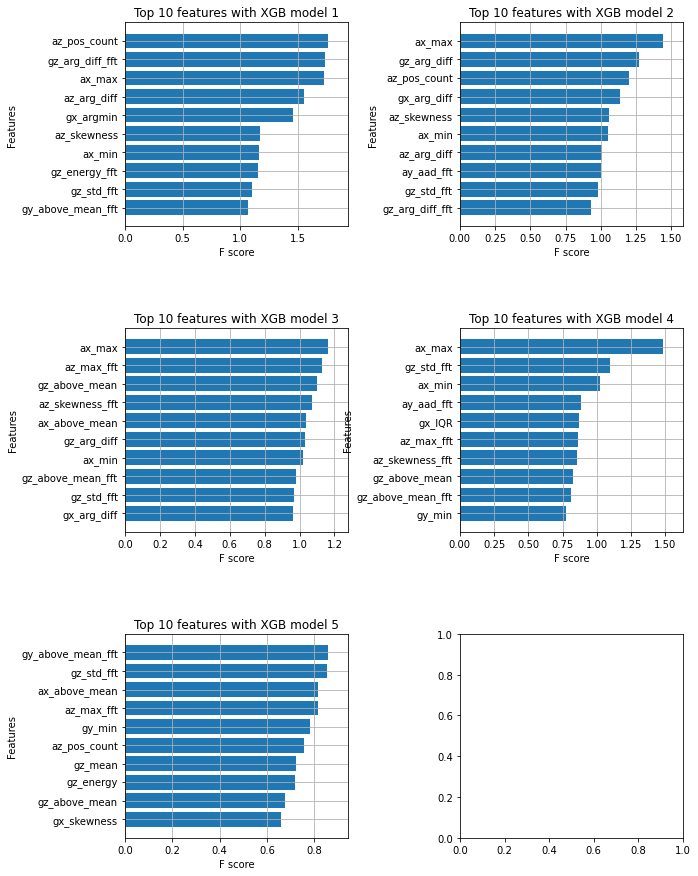

            Total time taken for XGBoost feature selection = 4 seconds
#######################################################################################
#####          F E A T U R E   S E L E C T I O N   C O M P L E T E D            #######
#######################################################################################
Selected 51 important features. Too many to print...

    Time taken for feature selection = 8 seconds
Returning 2 dataframes: dataname and test_data with 51 important features.
top 10 features: /n
['az_pos_count', 'gz_arg_diff_fft', 'ax_max', 'az_arg_diff', 'gx_argmin', 'az_skewness', 'ax_min', 'gz_energy_fft', 'gz_std_fft', 'gy_above_mean_fft']



 Random Forest - using top 10 features from individual model
test set Accuracy: 0.9115646258503401

 -------------Classification Report-------------

              precision    recall  f1-score   support

         0.0       0.91      1.00      0.95       403
         1.0       0.00      0.00      0.00        38


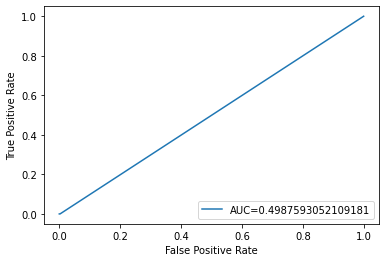

Validation set Accuracy: 0.9117647058823529

 -------------Classification Report-------------

              precision    recall  f1-score   support

         0.0       0.91      1.00      0.95       404
         1.0       0.00      0.00      0.00        38

    accuracy                           0.91       442
   macro avg       0.46      0.50      0.48       442
weighted avg       0.84      0.91      0.87       442

test set:
[[403   1]
 [ 38   0]]


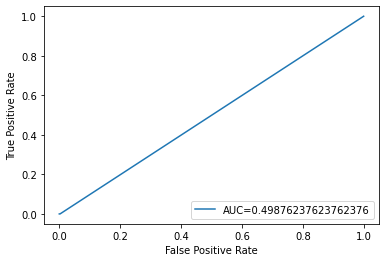

RB
left

 Random Forest - using top 10 features from global model
test set Accuracy: 0.8353658536585366

 -------------Classification Report-------------

              precision    recall  f1-score   support

         0.0       0.65      0.39      0.49        33
         1.0       0.86      0.95      0.90       131

    accuracy                           0.84       164
   macro avg       0.76      0.67      0.70       164
weighted avg       0.82      0.84      0.82       164

test set:
[[ 13  20]
 [  7 124]]


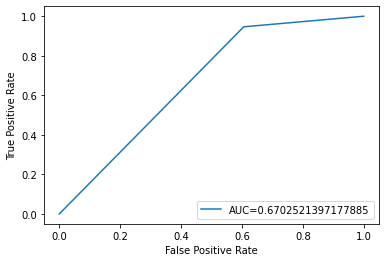

Validation set Accuracy: 0.823170731707317

 -------------Classification Report-------------

              precision    recall  f1-score   support

         0.0       0.59      0.31      0.41        32
         1.0       0.85      0.95      0.90       132

    accuracy                           0.82       164
   macro avg       0.72      0.63      0.65       164
weighted avg       0.80      0.82      0.80       164

test set:
[[ 10  22]
 [  7 125]]


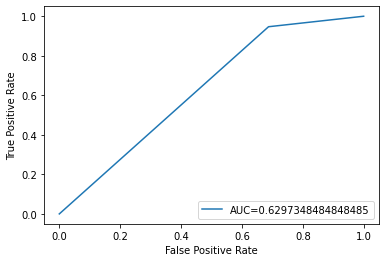

############################################################################################
############       F A S T   F E A T U R E  E N G G    A N D    S E L E C T I O N ! ########
# Be judicious with featurewiz. Don't use it to create too many un-interpretable features! #
############################################################################################
Skipping feature engineering since no feature_engg input...
Skipping category encoding since no category encoders specified in input...
**INFO: featurewiz can now read feather formatted files. Loading train data...
    Shape of your Data Set loaded: (491, 225)
    Loaded train data. Shape = (491, 225)
No test data filename given...
#######################################################################################
######################## C L A S S I F Y I N G  V A R I A B L E S  ####################
#######################################################################################
Classifying variables in data 

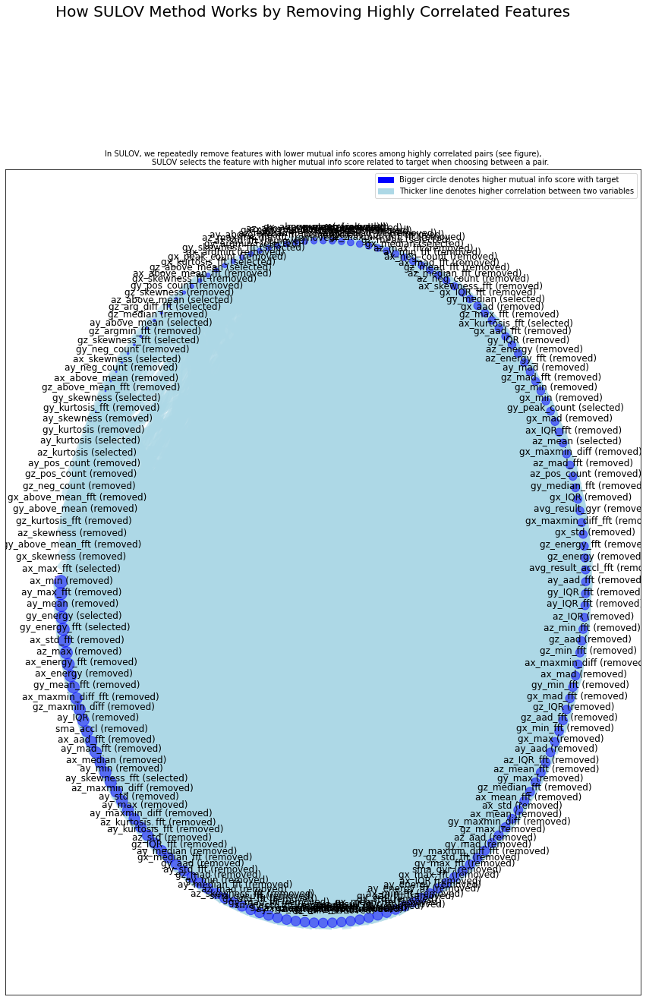

Time taken for SULOV method = 3 seconds
    Adding 0 categorical variables to reduced numeric variables  of 63
Final list of selected vars after SULOV = 63
Readying dataset for Recursive XGBoost by converting all features to numeric...
#######################################################################################
#####    R E C U R S I V E   X G B O O S T : F E A T U R E   S E L E C T I O N  #######
#######################################################################################
    using regular XGBoost
Train and Test loaded into Dask dataframes successfully after feature_engg completed
Current number of predictors = 63 
    XGBoost version: 1.6.1
Number of booster rounds = 100
        using 63 variables...
            Time taken for regular XGBoost feature selection = 0 seconds
        using 50 variables...
            Time taken for regular XGBoost feature selection = 0 seconds
        using 37 variables...
            Time taken for regular XGBoost feature selection

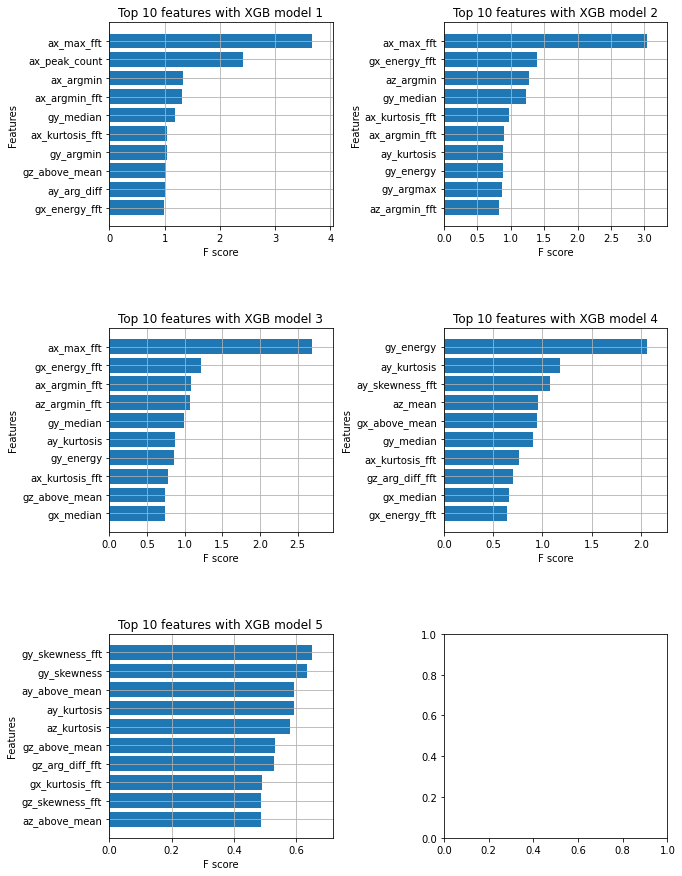

            Total time taken for XGBoost feature selection = 2 seconds
#######################################################################################
#####          F E A T U R E   S E L E C T I O N   C O M P L E T E D            #######
#######################################################################################
Selected 47 important features. Too many to print...

    Time taken for feature selection = 4 seconds
Returning 2 dataframes: dataname and test_data with 47 important features.
top 10 features: /n
['ax_max_fft', 'ax_peak_count', 'ax_argmin', 'ax_argmin_fft', 'gy_median', 'ax_kurtosis_fft', 'gy_argmin', 'gz_above_mean', 'ay_arg_diff', 'gx_energy_fft']



 Random Forest - using top 10 features from individual model
test set Accuracy: 0.7865853658536586

 -------------Classification Report-------------

              precision    recall  f1-score   support

         0.0       0.45      0.30      0.36        33
         1.0       0.84      0.91      0.87      

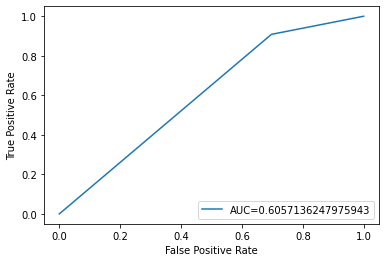

Validation set Accuracy: 0.8414634146341463

 -------------Classification Report-------------

              precision    recall  f1-score   support

         0.0       0.69      0.34      0.46        32
         1.0       0.86      0.96      0.91       132

    accuracy                           0.84       164
   macro avg       0.77      0.65      0.68       164
weighted avg       0.82      0.84      0.82       164

test set:
[[ 11  21]
 [  5 127]]


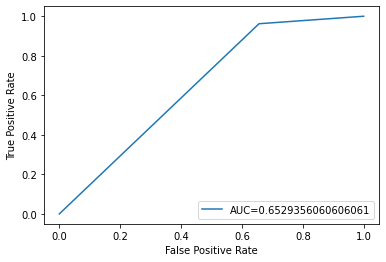

Right

 Random Forest - using top 10 features from global model
test set Accuracy: 0.823170731707317

 -------------Classification Report-------------

              precision    recall  f1-score   support

         0.0       0.61      0.33      0.43        33
         1.0       0.85      0.95      0.90       131

    accuracy                           0.82       164
   macro avg       0.73      0.64      0.66       164
weighted avg       0.80      0.82      0.80       164

test set:
[[ 11  22]
 [  7 124]]


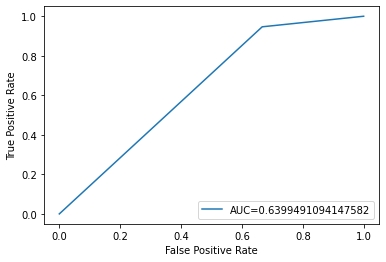

Validation set Accuracy: 0.8170731707317073

 -------------Classification Report-------------

              precision    recall  f1-score   support

         0.0       0.60      0.19      0.29        32
         1.0       0.83      0.97      0.90       132

    accuracy                           0.82       164
   macro avg       0.72      0.58      0.59       164
weighted avg       0.79      0.82      0.78       164

test set:
[[  6  26]
 [  4 128]]


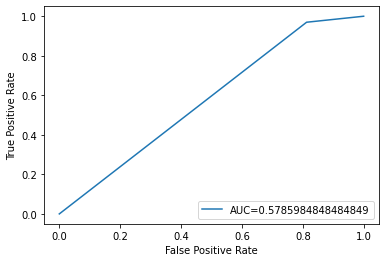

############################################################################################
############       F A S T   F E A T U R E  E N G G    A N D    S E L E C T I O N ! ########
# Be judicious with featurewiz. Don't use it to create too many un-interpretable features! #
############################################################################################
Skipping feature engineering since no feature_engg input...
Skipping category encoding since no category encoders specified in input...
**INFO: featurewiz can now read feather formatted files. Loading train data...
    Shape of your Data Set loaded: (491, 225)
    Loaded train data. Shape = (491, 225)
No test data filename given...
#######################################################################################
######################## C L A S S I F Y I N G  V A R I A B L E S  ####################
#######################################################################################
Classifying variables in data 

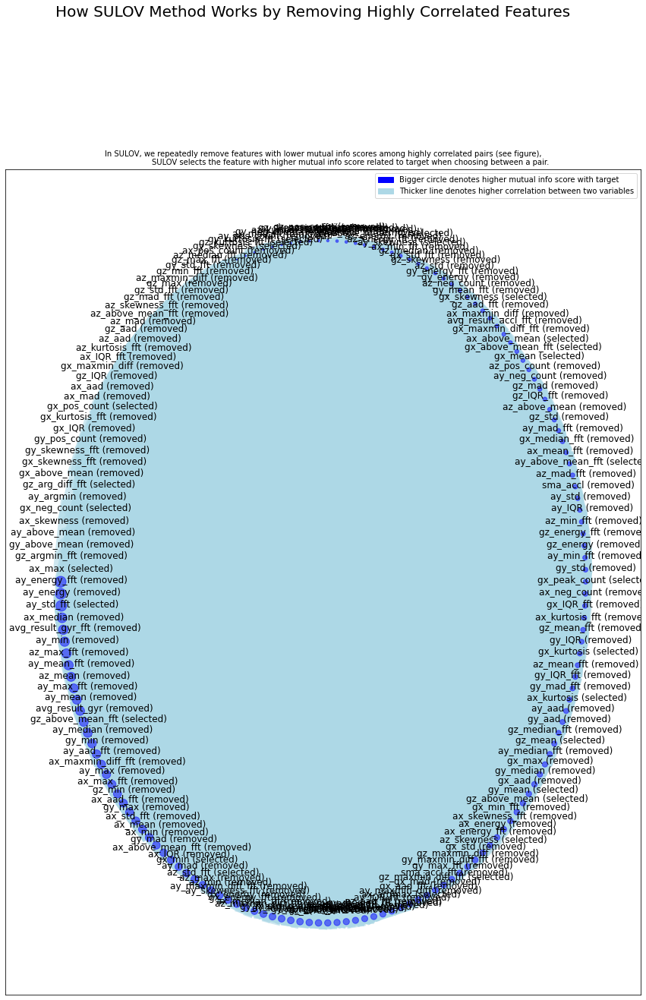

Time taken for SULOV method = 3 seconds
    Adding 0 categorical variables to reduced numeric variables  of 69
Final list of selected vars after SULOV = 69
Readying dataset for Recursive XGBoost by converting all features to numeric...
#######################################################################################
#####    R E C U R S I V E   X G B O O S T : F E A T U R E   S E L E C T I O N  #######
#######################################################################################
    using regular XGBoost
Train and Test loaded into Dask dataframes successfully after feature_engg completed
Current number of predictors = 69 
    XGBoost version: 1.6.1
Number of booster rounds = 100
        using 69 variables...
            Time taken for regular XGBoost feature selection = 0 seconds
        using 55 variables...
            Time taken for regular XGBoost feature selection = 0 seconds
        using 41 variables...
            Time taken for regular XGBoost feature selection

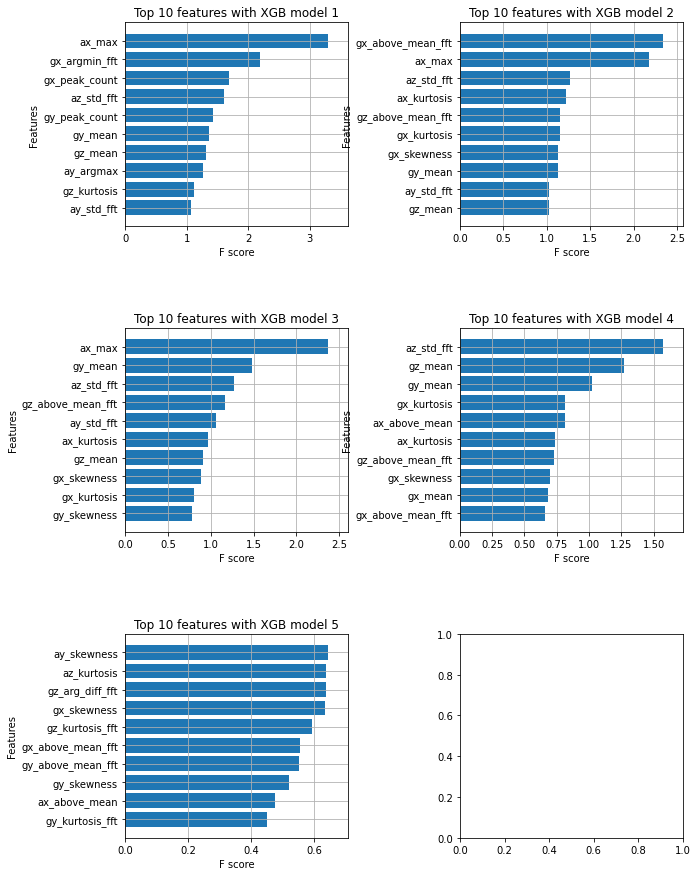

            Total time taken for XGBoost feature selection = 3 seconds
#######################################################################################
#####          F E A T U R E   S E L E C T I O N   C O M P L E T E D            #######
#######################################################################################
Selected 50 important features. Too many to print...

    Time taken for feature selection = 6 seconds
Returning 2 dataframes: dataname and test_data with 50 important features.
top 10 features: /n
['ax_max', 'gx_argmin_fft', 'gx_peak_count', 'az_std_fft', 'gy_peak_count', 'gy_mean', 'gz_mean', 'ay_argmax', 'gz_kurtosis', 'ay_std_fft']



 Random Forest - using top 10 features from individual model
test set Accuracy: 0.823170731707317

 -------------Classification Report-------------

              precision    recall  f1-score   support

         0.0       0.60      0.36      0.45        33
         1.0       0.85      0.94      0.89       131

    accurac

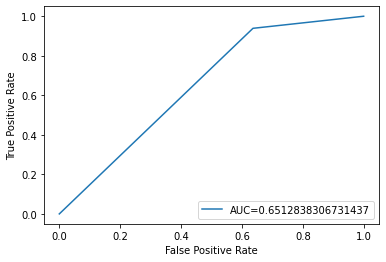

Validation set Accuracy: 0.8109756097560976

 -------------Classification Report-------------

              precision    recall  f1-score   support

         0.0       0.53      0.25      0.34        32
         1.0       0.84      0.95      0.89       132

    accuracy                           0.81       164
   macro avg       0.69      0.60      0.62       164
weighted avg       0.78      0.81      0.78       164

test set:
[[  8  24]
 [  7 125]]


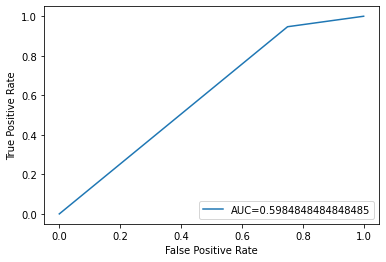

RSS
left

 Random Forest - using top 10 features from global model
test set Accuracy: 0.7675544794188862

 -------------Classification Report-------------

              precision    recall  f1-score   support

         0.0       0.79      0.91      0.84       287
         1.0       0.68      0.44      0.54       126

    accuracy                           0.77       413
   macro avg       0.74      0.68      0.69       413
weighted avg       0.76      0.77      0.75       413

test set:
[[261  26]
 [ 70  56]]


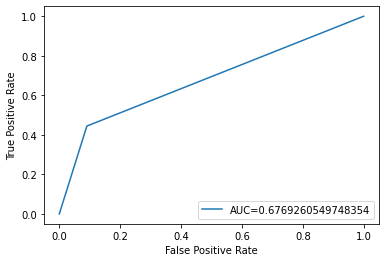

Validation set Accuracy: 0.7409200968523002

 -------------Classification Report-------------

              precision    recall  f1-score   support

         0.0       0.77      0.90      0.83       287
         1.0       0.63      0.37      0.47       126

    accuracy                           0.74       413
   macro avg       0.70      0.64      0.65       413
weighted avg       0.72      0.74      0.72       413

test set:
[[259  28]
 [ 79  47]]


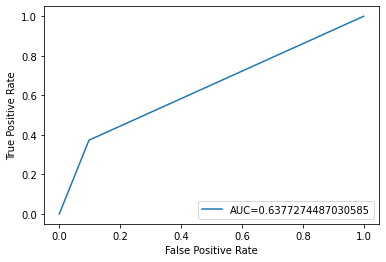

############################################################################################
############       F A S T   F E A T U R E  E N G G    A N D    S E L E C T I O N ! ########
# Be judicious with featurewiz. Don't use it to create too many un-interpretable features! #
############################################################################################
Skipping feature engineering since no feature_engg input...
Skipping category encoding since no category encoders specified in input...
**INFO: featurewiz can now read feather formatted files. Loading train data...
    Shape of your Data Set loaded: (1238, 225)
    Loaded train data. Shape = (1238, 225)
No test data filename given...
#######################################################################################
######################## C L A S S I F Y I N G  V A R I A B L E S  ####################
#######################################################################################
Classifying variables in dat

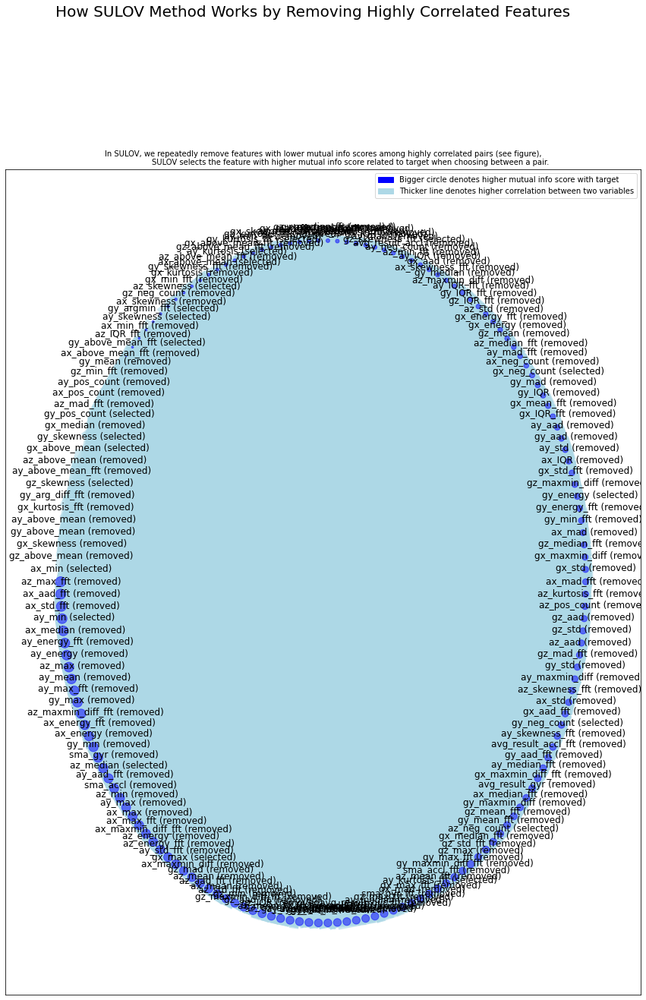

Time taken for SULOV method = 3 seconds
    Adding 0 categorical variables to reduced numeric variables  of 67
Final list of selected vars after SULOV = 67
Readying dataset for Recursive XGBoost by converting all features to numeric...
#######################################################################################
#####    R E C U R S I V E   X G B O O S T : F E A T U R E   S E L E C T I O N  #######
#######################################################################################
    using regular XGBoost
Train and Test loaded into Dask dataframes successfully after feature_engg completed
Current number of predictors = 67 
    XGBoost version: 1.6.1
Number of booster rounds = 100
        using 67 variables...
            Time taken for regular XGBoost feature selection = 0 seconds
        using 54 variables...
            Time taken for regular XGBoost feature selection = 1 seconds
        using 41 variables...
            Time taken for regular XGBoost feature selection

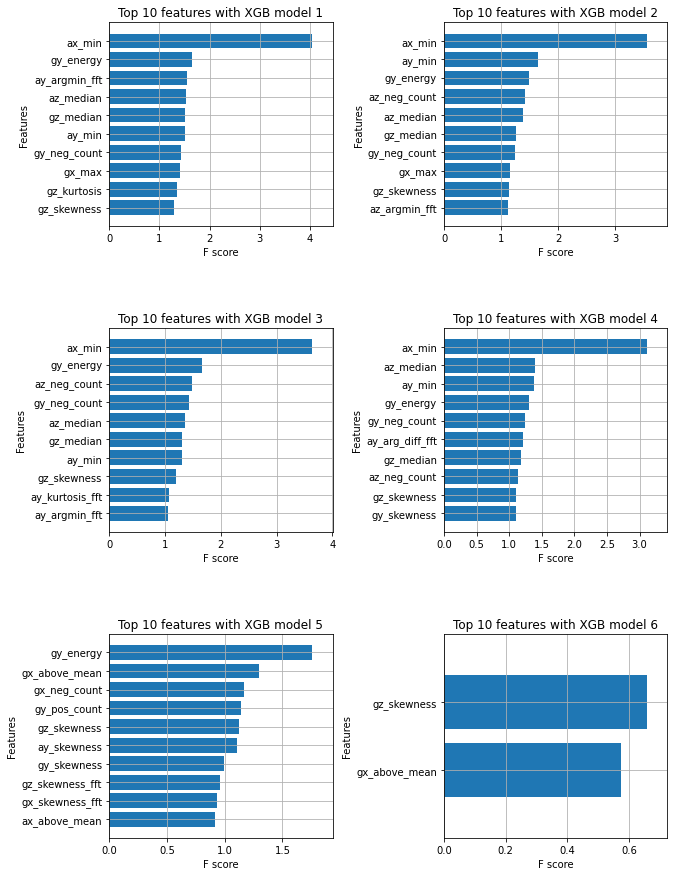

            Total time taken for XGBoost feature selection = 4 seconds
#######################################################################################
#####          F E A T U R E   S E L E C T I O N   C O M P L E T E D            #######
#######################################################################################
Selected 57 important features. Too many to print...

    Time taken for feature selection = 7 seconds
Returning 2 dataframes: dataname and test_data with 57 important features.
top 10 features: /n
['ax_min', 'gy_energy', 'ay_argmin_fft', 'az_median', 'gz_median', 'ay_min', 'gy_neg_count', 'gx_max', 'gz_kurtosis', 'gz_skewness']



 Random Forest - using top 10 features from individual model
test set Accuracy: 0.7651331719128329

 -------------Classification Report-------------

              precision    recall  f1-score   support

         0.0       0.78      0.91      0.84       287
         1.0       0.68      0.43      0.53       126

    accuracy     

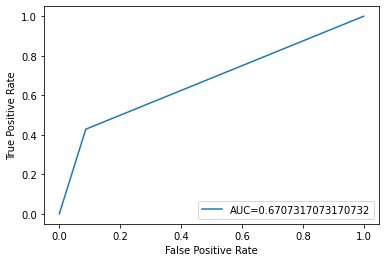

Validation set Accuracy: 0.738498789346247

 -------------Classification Report-------------

              precision    recall  f1-score   support

         0.0       0.77      0.90      0.83       287
         1.0       0.62      0.37      0.47       126

    accuracy                           0.74       413
   macro avg       0.69      0.64      0.65       413
weighted avg       0.72      0.74      0.72       413

test set:
[[258  29]
 [ 79  47]]


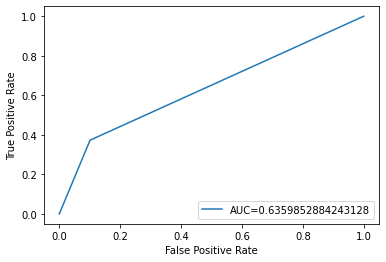

Right

 Random Forest - using top 10 features from global model
test set Accuracy: 0.7578692493946732

 -------------Classification Report-------------

              precision    recall  f1-score   support

         0.0       0.79      0.88      0.83       287
         1.0       0.64      0.48      0.55       126

    accuracy                           0.76       413
   macro avg       0.72      0.68      0.69       413
weighted avg       0.75      0.76      0.75       413

test set:
[[252  35]
 [ 65  61]]


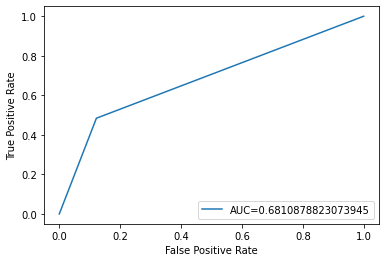

Validation set Accuracy: 0.7796610169491526

 -------------Classification Report-------------

              precision    recall  f1-score   support

         0.0       0.81      0.89      0.85       287
         1.0       0.67      0.54      0.60       126

    accuracy                           0.78       413
   macro avg       0.74      0.71      0.72       413
weighted avg       0.77      0.78      0.77       413

test set:
[[254  33]
 [ 58  68]]


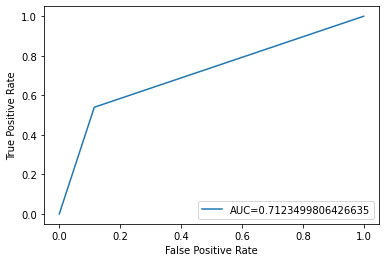

############################################################################################
############       F A S T   F E A T U R E  E N G G    A N D    S E L E C T I O N ! ########
# Be judicious with featurewiz. Don't use it to create too many un-interpretable features! #
############################################################################################
Skipping feature engineering since no feature_engg input...
Skipping category encoding since no category encoders specified in input...
**INFO: featurewiz can now read feather formatted files. Loading train data...
    Shape of your Data Set loaded: (1238, 225)
    Loaded train data. Shape = (1238, 225)
No test data filename given...
#######################################################################################
######################## C L A S S I F Y I N G  V A R I A B L E S  ####################
#######################################################################################
Classifying variables in dat

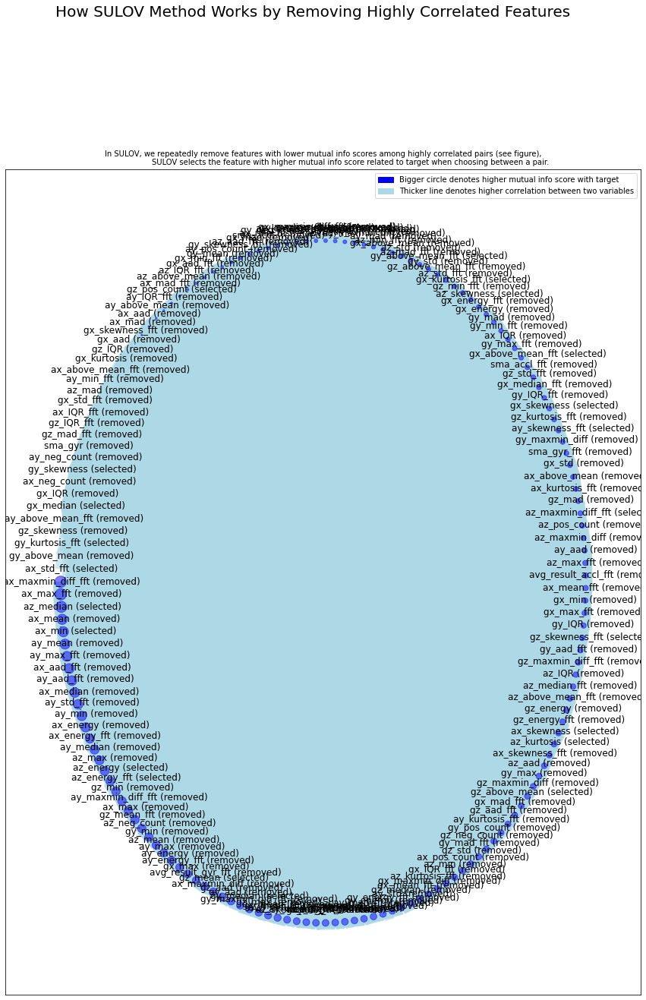

Time taken for SULOV method = 3 seconds
    Adding 0 categorical variables to reduced numeric variables  of 71
Final list of selected vars after SULOV = 71
Readying dataset for Recursive XGBoost by converting all features to numeric...
#######################################################################################
#####    R E C U R S I V E   X G B O O S T : F E A T U R E   S E L E C T I O N  #######
#######################################################################################
    using regular XGBoost
Train and Test loaded into Dask dataframes successfully after feature_engg completed
Current number of predictors = 71 
    XGBoost version: 1.6.1
Number of booster rounds = 100
        using 71 variables...
            Time taken for regular XGBoost feature selection = 1 seconds
        using 57 variables...
            Time taken for regular XGBoost feature selection = 1 seconds
        using 43 variables...
            Time taken for regular XGBoost feature selection

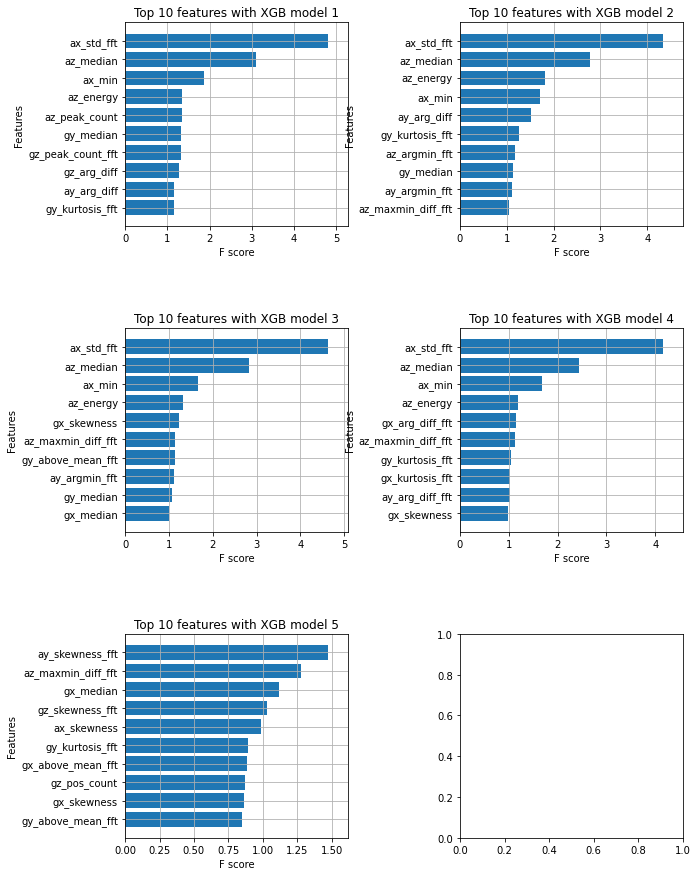

            Total time taken for XGBoost feature selection = 3 seconds
#######################################################################################
#####          F E A T U R E   S E L E C T I O N   C O M P L E T E D            #######
#######################################################################################
Selected 51 important features. Too many to print...

    Time taken for feature selection = 6 seconds
Returning 2 dataframes: dataname and test_data with 51 important features.
top 10 features: /n
['ax_std_fft', 'az_median', 'ax_min', 'az_energy', 'az_peak_count', 'gy_median', 'gz_peak_count_fft', 'gz_arg_diff', 'ay_arg_diff', 'gy_kurtosis_fft']



 Random Forest - using top 10 features from individual model
test set Accuracy: 0.7869249394673123

 -------------Classification Report-------------

              precision    recall  f1-score   support

         0.0       0.83      0.88      0.85       287
         1.0       0.68      0.58      0.62       126


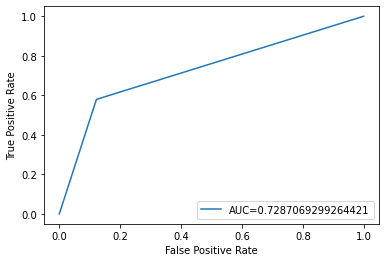

Validation set Accuracy: 0.7796610169491526

 -------------Classification Report-------------

              precision    recall  f1-score   support

         0.0       0.82      0.87      0.85       287
         1.0       0.66      0.57      0.61       126

    accuracy                           0.78       413
   macro avg       0.74      0.72      0.73       413
weighted avg       0.77      0.78      0.77       413

test set:
[[250  37]
 [ 54  72]]


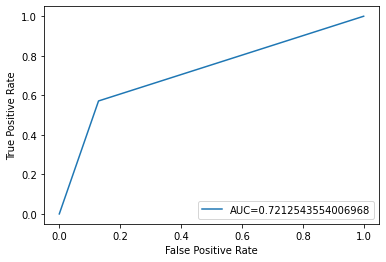

In [35]:
top_10_global = ['gy_maxmin_diff_fft', 'ay_max', 'gz_energy_fft', 'ax_median', 'gz_median', 'ay_min', 'az_neg_count', 'az_std_fft', 'gz_kurtosis_fft', 'ax_min']

for folder in subfolders:    
    EXT = "*.csv"
    files = [file
                     for path, subdir, files in os.walk(folder)
                     for file in glob.glob(os.path.join(path, EXT))]
    X_left = np.empty((0,15,6))
    y_left = np.empty((0))
    X_right = np.empty((0,15,6))
    y_right = np.empty((0))
    print(os.path.basename(folder))
    for file in files:
        df = pd.read_csv(file,index_col=[0])
        f= list(df['freezing'])
        for i in range(1, len(f)):
            if (f[i]!= f[i-1] and f[i]==1):
                j = i-1
                while (j>=0 and (i-j)<=10):    #classiying prefreezing as freezing (10 iterations before actual freezing ~ 0.33 sec)
                    f[j] = 1
                    j-=1
        df['freezing'] = f
        df = df.drop(['turning'],axis=1)
        clms = ['ax','ay','az','gx','gy','gz']
        agm = np.array(df[clms])
        agm_new = DA_Jitter(agm)
        df_new = pd.DataFrame(agm)
        df_new.columns = clms
        df_new['freezing'] = f
        temp_x, temp_y = csab(df_new, 15, 11)
        if os.path.basename(file)[0] =='l':
            X_left = np.append(X_left, temp_x, axis = 0)
            y_left = np.append(y_left, temp_y, axis = 0)
        else:
            X_right = np.append(X_right, temp_x, axis = 0)
            y_right = np.append(y_right, temp_y, axis = 0)
    
    print ('left')
    
    
    X_train, X_rem, y_train, y_rem = train_test_split(X_left,y_left, train_size=0.6, random_state = 861, stratify = y_left)
    X_test, X_valid, y_test, y_valid = train_test_split(X_rem, y_rem, train_size = 0.5, random_state = 861, stratify = y_rem)
    X_train_new = cfeatures(X_train)
    X_test_new = cfeatures(X_test)
    X_valid_new = cfeatures(X_valid)
    
    X_train_top_10_global = X_train_new[top_10_global]
    X_test_top_10_global = X_test_new[top_10_global]
    X_valid_top_10_global = X_valid_new[top_10_global]
    
    feature_names = list(X_train_top_10_global.columns.values)
    # standardization
    scaler = StandardScaler()
    scaler.fit(X_train_top_10_global)
    X_train_top_10_global_scaled = scaler.transform(X_train_top_10_global)
    X_test_top_10_global_scaled = scaler.transform(X_test_top_10_global)
    X_valid_top_10_global_scaled = scaler.transform(X_valid_top_10_global)
    
    if (np.sum(y_train)==0):
        continue
    
    
    print('\n Random Forest - using top 10 features from global model')
    model = RandomForestClassifier()
    model.fit(X_train_top_10_global_scaled, y_train)
    y_pred_rf = model.predict(X_test_top_10_global_scaled)
    print("test set Accuracy:", accuracy_score(y_test, y_pred_rf))
    print("\n -------------Classification Report-------------\n")
    print(classification_report(y_test, y_pred_rf))
    print ('test set:')
    cm = confusion_matrix(y_test, y_pred_rf)
    print(cm)
    fpr, tpr, _ = metrics.roc_curve(y_test,  y_pred_rf)
    auc = metrics.roc_auc_score(y_test, y_pred_rf)
    #create ROC curve
    plt.plot(fpr,tpr,label="AUC="+str(auc))
    plt.ylabel('True Positive Rate')
    plt.xlabel('False Positive Rate')
    plt.legend(loc=4)
    plt.show()
    
    #Validation set
    y_pred_valid_rf = model.predict(X_valid_top_10_global_scaled)
    print("Validation set Accuracy:", accuracy_score(y_valid, y_pred_valid_rf))
    print("\n -------------Classification Report-------------\n")
    print(classification_report(y_valid, y_pred_valid_rf))
    print ('test set:')
    cm2 = confusion_matrix(y_valid, y_pred_valid_rf)
    print(cm2)
    fpr, tpr, _ = metrics.roc_curve(y_valid,  y_pred_valid_rf)
    auc = metrics.roc_auc_score(y_valid, y_pred_valid_rf)
    #create ROC curve
    plt.plot(fpr,tpr,label="AUC="+str(auc))
    plt.ylabel('True Positive Rate')
    plt.xlabel('False Positive Rate')
    plt.legend(loc=4)
    plt.show()
    
    df_train = X_train_new.copy()
    df_train['freezing'] = y_train
    
    target = 'freezing'

    features, train_ = featurewiz(df_train, target, corr_limit=0.5,verbose=2, sep=",",
    header=0,test_data="", feature_engg="", category_encoders="")
    arr = list(features[:10])
    print ('top 10 features: /n')
    print(arr)
    print ('\n')
    
    X_train_top_10 = X_train_new[arr]
    X_test_top_10 = X_test_new[arr]
    X_valid_top_10 = X_valid_new[arr]
    
    # standardization
    scaler = StandardScaler()
    scaler.fit(X_train_top_10)
    X_train_top_10_scaled = scaler.transform(X_train_top_10)
    X_test_top_10_scaled = scaler.transform(X_test_top_10)
    X_valid_top_10_scaled = scaler.transform(X_valid_top_10)
    
    print('\n Random Forest - using top 10 features from individual model')
    model = RandomForestClassifier()
    model.fit(X_train_top_10_scaled, y_train)
    
    #test set
    y_pred_rf = model.predict(X_test_top_10_scaled)
    print("test set Accuracy:", accuracy_score(y_test, y_pred_rf))
    print("\n -------------Classification Report-------------\n")
    print(classification_report(y_test, y_pred_rf))
    print ('test set:')
    cm = confusion_matrix(y_test, y_pred_rf)
    print(cm)
    fpr, tpr, _ = metrics.roc_curve(y_test,  y_pred_rf)
    auc = metrics.roc_auc_score(y_test, y_pred_rf)
    #create ROC curve
    plt.plot(fpr,tpr,label="AUC="+str(auc))
    plt.ylabel('True Positive Rate')
    plt.xlabel('False Positive Rate')
    plt.legend(loc=4)
    plt.show()
    
    
    y_pred_valid_rf = model.predict(X_valid_top_10_scaled)
    print("Validation set Accuracy:", accuracy_score(y_valid, y_pred_valid_rf))
    print("\n -------------Classification Report-------------\n")
    print(classification_report(y_valid, y_pred_valid_rf))
    print ('test set:')
    cm2 = confusion_matrix(y_valid, y_pred_valid_rf)
    print(cm2)
    fpr, tpr, _ = metrics.roc_curve(y_valid,  y_pred_valid_rf)
    auc = metrics.roc_auc_score(y_valid, y_pred_valid_rf)
    #create ROC curve
    plt.plot(fpr,tpr,label="AUC="+str(auc))
    plt.ylabel('True Positive Rate')
    plt.xlabel('False Positive Rate')
    plt.legend(loc=4)
    plt.show()
    
    
    print ('Right')
    
    X_train, X_rem, y_train, y_rem = train_test_split(X_right,y_right, train_size=0.6, random_state = 861, stratify = y_right)
    X_test, X_valid, y_test, y_valid = train_test_split(X_rem, y_rem, train_size = 0.5, random_state = 861, stratify = y_rem)
    X_train_new = cfeatures(X_train)
    X_test_new = cfeatures(X_test)
    X_valid_new = cfeatures(X_valid)
    
    X_train_top_10_global = X_train_new[top_10_global]
    X_test_top_10_global = X_test_new[top_10_global]
    X_valid_top_10_global = X_valid_new[top_10_global]
    
    feature_names = list(X_train_top_10_global.columns.values)
    # standardization
    scaler = StandardScaler()
    scaler.fit(X_train_top_10_global)
    X_train_top_10_global_scaled = scaler.transform(X_train_top_10_global)
    X_test_top_10_global_scaled = scaler.transform(X_test_top_10_global)
    X_valid_top_10_global_scaled = scaler.transform(X_valid_top_10_global)
    
    if (np.sum(y_train)==0):
        continue
    
    
    print('\n Random Forest - using top 10 features from global model')
    model = RandomForestClassifier()
    model.fit(X_train_top_10_global_scaled, y_train)

    y_pred_rf = model.predict(X_test_top_10_global_scaled)
    print("test set Accuracy:", accuracy_score(y_test, y_pred_rf))
    print("\n -------------Classification Report-------------\n")
    print(classification_report(y_test, y_pred_rf))
    print ('test set:')
    cm = confusion_matrix(y_test, y_pred_rf)
    print(cm)
    fpr, tpr, _ = metrics.roc_curve(y_test,  y_pred_rf)
    auc = metrics.roc_auc_score(y_test, y_pred_rf)
    #create ROC curve
    plt.plot(fpr,tpr,label="AUC="+str(auc))
    plt.ylabel('True Positive Rate')
    plt.xlabel('False Positive Rate')
    plt.legend(loc=4)
    plt.show()
    
    
    y_pred_valid_rf = model.predict(X_valid_top_10_global_scaled)
    print("Validation set Accuracy:", accuracy_score(y_valid, y_pred_valid_rf))
    print("\n -------------Classification Report-------------\n")
    print(classification_report(y_valid, y_pred_valid_rf))
    print ('test set:')
    cm2 = confusion_matrix(y_valid, y_pred_valid_rf)
    print(cm2)
    fpr, tpr, _ = metrics.roc_curve(y_valid,  y_pred_valid_rf)
    auc = metrics.roc_auc_score(y_valid, y_pred_valid_rf)
    #create ROC curve
    plt.plot(fpr,tpr,label="AUC="+str(auc))
    plt.ylabel('True Positive Rate')
    plt.xlabel('False Positive Rate')
    plt.legend(loc=4)
    plt.show()
    
    df_train = X_train_new.copy()
    df_train['freezing'] = y_train
    
    target = 'freezing'

    features, train_ = featurewiz(df_train, target, corr_limit=0.5,verbose=2, sep=",",
    header=0,test_data="", feature_engg="", category_encoders="")
    arr = list(features[:10])
    print ('top 10 features: /n')
    print(arr)
    print ('\n')
    
    X_train_top_10 = X_train_new[arr]
    X_test_top_10 = X_test_new[arr]
    X_valid_top_10 = X_valid_new[arr]
    
    # standardization
    scaler = StandardScaler()
    scaler.fit(X_train_top_10)
    X_train_top_10_scaled = scaler.transform(X_train_top_10)
    X_test_top_10_scaled = scaler.transform(X_test_top_10)
    X_valid_top_10_scaled = scaler.transform(X_valid_top_10)
    
    print('\n Random Forest - using top 10 features from individual model')
    model = RandomForestClassifier()
    model.fit(X_train_top_10_scaled, y_train)
    
    y_pred_rf = model.predict(X_test_top_10_scaled)
    print("test set Accuracy:", accuracy_score(y_test, y_pred_rf))
    print("\n -------------Classification Report-------------\n")
    print(classification_report(y_test, y_pred_rf))
    print ('test set:')
    cm = confusion_matrix(y_test, y_pred_rf)
    print(cm)
    fpr, tpr, _ = metrics.roc_curve(y_test,  y_pred_rf)
    auc = metrics.roc_auc_score(y_test, y_pred_rf)
    #create ROC curve
    plt.plot(fpr,tpr,label="AUC="+str(auc))
    plt.ylabel('True Positive Rate')
    plt.xlabel('False Positive Rate')
    plt.legend(loc=4)
    plt.show()
    
    
    y_pred_valid_rf = model.predict(X_valid_top_10_scaled)
    print("Validation set Accuracy:", accuracy_score(y_valid, y_pred_valid_rf))
    print("\n -------------Classification Report-------------\n")
    print(classification_report(y_valid, y_pred_valid_rf))
    print ('test set:')
    cm2 = confusion_matrix(y_valid, y_pred_valid_rf)
    print(cm2)
    fpr, tpr, _ = metrics.roc_curve(y_valid,  y_pred_valid_rf)
    auc = metrics.roc_auc_score(y_valid, y_pred_valid_rf)
    #create ROC curve
    plt.plot(fpr,tpr,label="AUC="+str(auc))
    plt.ylabel('True Positive Rate')
    plt.xlabel('False Positive Rate')
    plt.legend(loc=4)
    plt.show()

,ax,ay,az,gx,gy,gz
0,-2.171842,-9.709559,-0.159868,-0.051538,0.030845,-0.110039
1,-1.560298,-10.089830,-0.652453,-0.059043,0.129012,-0.147326
2,-1.868359,-9.961972,-0.505296,-0.030804,0.129751,-0.165883
3,-1.797030,-9.973255,-0.645380,-0.105240,-0.036133,-0.216617
4,-2.076557,-9.753693,-0.385376,-0.162475,-0.190379,-0.203542
...,...,...,...,...,...,...
6775,-2.592309,-9.600240,-1.739381,-0.361593,-0.755587,0.232571
6776,-2.523488,-9.501888,-1.676875,-0.313319,-0.616485,0.289002
6777,-2.028437,-9.906126,-1.981275,-0.282812,-0.363503,0.236040
6778,-2.772766,-9.582702,-2.383194,-0.240018,-0.324482,0.225006


,0,1,2,3,4,5
0,-2.171842,-9.709559,-0.159868,-0.051538,0.030845,-0.110039
1,-1.560298,-10.089830,-0.652453,-0.059043,0.129012,-0.147326
2,-1.868359,-9.961972,-0.505296,-0.030804,0.129751,-0.165883
3,-1.797030,-9.973255,-0.645380,-0.105240,-0.036133,-0.216617
4,-2.076557,-9.753693,-0.385376,-0.162475,-0.190379,-0.203542
...,...,...,...,...,...,...
6775,-2.592309,-9.600240,-1.739381,-0.361593,-0.755587,0.232571
6776,-2.523488,-9.501888,-1.676875,-0.313319,-0.616485,0.289002
6777,-2.028437,-9.906126,-1.981275,-0.282812,-0.363503,0.236040
6778,-2.772766,-9.582702,-2.383194,-0.240018,-0.324482,0.225006


In [5]:
top_10_global = ['gy_maxmin_diff_fft', 'ay_max', 'gz_energy_fft', 'ax_median', 'gz_median', 'ay_min', 'az_neg_count', 'az_std_fft', 'gz_kurtosis_fft', 'ax_min']

In [7]:
PATH = os.path.join(PATH,'AKK')

In [8]:
PATH

'D:\\LifeSpark Technology\\labelled(RL2)\\AKK'

In [15]:
X = np.empty((0,15,6))
y= np.empty((0))

for file in files:
    df = pd.read_csv(file,index_col=[0])
    f= list(df['freezing'])
    for i in range(1, len(f)):
        if (f[i]!= f[i-1] and f[i]==1):
            j = i-1
            while (j>=0 and (i-j)<=10):    #classiying prefreezing as freezing (10 iterations before actual freezing ~ 0.33 sec)
                f[j] = 1
                j-=1
    df['freezing'] = f
    df = df.drop(['turning'],axis=1)
    clms = ['ax','ay','az','gx','gy','gz']
    agm = np.array(df[clms])
    agm_new = DA_Jitter(agm)
    df_new = pd.DataFrame(agm)
    df_new.columns = clms
    df_new['freezing'] = f
    temp_x, temp_y = csab(df_new, 15, 11)
    X = np.append(X, temp_x, axis = 0)
    y = np.append(y, temp_y, axis = 0)


In [16]:
len(X)

1776

In [17]:
X.shape

(1776, 15, 6)

In [18]:
y.shape

(1776,)

In [19]:
X_new = cfeatures(X)

In [20]:
X_new

,ax_mean,ay_mean,az_mean,gx_mean,gy_mean,gz_mean,ax_std,ay_std,az_std,gx_std,...,az_argmin_fft,gx_argmin_fft,gy_argmin_fft,gz_argmin_fft,ax_arg_diff_fft,ay_arg_diff_fft,az_arg_diff_fft,gx_arg_diff_fft,gy_arg_diff_fft,gz_arg_diff_fft
0,-1.045078,-9.828247,-0.123638,0.029869,0.011926,-0.119325,0.510014,0.233470,0.381841,0.028749,...,2,5,13,8,3,3,2,5,13,8
1,-0.794712,-9.919437,0.046452,0.012525,-0.036172,-0.046039,0.398473,0.183642,0.386462,0.026640,...,6,5,3,6,4,3,6,5,3,6
2,-0.576690,-9.897611,0.089779,-0.002754,0.055497,-0.043356,0.388949,0.186738,0.354338,0.014342,...,3,8,5,7,7,5,3,8,5,7
3,-0.486592,-9.932350,0.027624,-0.046509,-0.060132,-0.028661,0.362246,0.121074,0.314948,0.043073,...,5,6,3,10,2,1,5,6,3,10
4,-0.269828,-9.920025,-0.148597,-0.064237,-0.240606,0.017195,1.011966,0.253516,0.513757,0.069538,...,11,5,4,2,1,3,11,5,4,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1771,-2.125776,-10.014163,-0.934309,0.092985,0.423333,-0.207161,0.730070,0.389720,0.970966,0.179000,...,4,11,5,3,4,3,4,11,5,3
1772,-1.436468,-10.009268,-0.192816,0.528355,0.947876,-0.098671,1.097355,0.608326,1.343205,0.181677,...,3,7,4,3,8,5,3,7,4,3
1773,-1.922696,-9.423041,1.410301,0.360890,1.109453,0.144572,4.148227,0.685749,3.540979,0.309134,...,13,10,6,3,6,8,13,10,6,3
1774,-2.681601,-9.457213,1.301846,0.248687,0.727533,0.062396,5.687443,1.314023,3.065175,0.329144,...,4,3,4,7,11,2,4,3,4,7


In [21]:
X_top10 = X_new[top_10_global]

In [23]:
X_top10['freezing'] = y

In [27]:
X_top10.to_csv('KS_top10(global).csv', index = False)